##Name: Salah Eslim
##student id: st20313374



##Github repo:https://github.com/salaheslim/Salah-Beijing-Airpollution-app.git

##stremlit app:https://salah-beijing-airpollution-app-pxdkfcgqxxrajj5duzse7x.streamlit.app/

Module Code: CMP7005
Module Title: Programming for Data Analysis
Academic year:2024-2025

Air pollution Analysis

Mitigate air pollution through the forecasting of air quality in Beijing (capital of China)

This project analyzes hourly air quality data from 12 monitoring stations in Beijing, spanning 2013 to 2017. It includes both pollutant measurements (PM2.5, PM10, SO2, NO2, CO, O3) and meteorological conditions (wind speed, rainfall, temperature, dew point, and pressure). The goal is to apply programming-driven techniques to process and analyze the data, solving real-world problems while utilizing version control and collaboration tools for effective workflow management.

###Task 1 : Data Handling

To handle the data we have to do some process








1- import necessary libraries that i work on it.

2- Import, select and merge data.

3- site type classification (categorize the station by type as requested ((urban, suburban, rural, industrial)

5- Saves the updated dataset with the site type information

Import the necessary libraries.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import os
import glob
import random
import joblib
import warnings
warnings.filterwarnings('ignore')

2- Import select and merge data.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
%cd '/content/drive/MyDrive/data sets/Merged cities '

/content/drive/MyDrive/data sets/Merged cities 


In [4]:
%ls

analyzed_data/
analyzed_data.csv
app.py
merged_data.csv
PRSA_Data_Changping_20130301-20170228.csv
PRSA_Data_Dingling_20130301-20170228.csv
PRSA_Data_Dongsi_20130301-20170228.csv
PRSA_Data_Shunyi_20130301-20170228.csv
random_forest_pm25_model.joblib


The dataset is chosen based on parameters such as urban, industrial, rural, and suburban because these classifications reflect significant variations in air pollution sources, atmospheric conditions, and human activities.

1.	Dongsi (Urban):located in central BeijingIt -densely populated where traffic and residential pollution are significant contributors to air quality.significant contributors to air pollution due to vehicle emissions, construction activities, and heating systems. urban air quality helps understand pollution exposure in densely populated areas and assess health risks.
2.	Changping (Suburban):Changping is situated on the outskirts of Beijing and is considered a suburban area.It represents the transitional zone between urban and rural areas, where the impact of urban sprawl and moderate industrial activity can be observed.These areas are hotspots for pollutants like SO2, PM10, and NO2, often resulting from factory emissions and industrial processes.industrial data helps in identifying the impact of manufacturing and energy production on air quality.
3.	Dingling (Rural):Dingling is located in northern Beijing, characterized by its rural environment.It serves as a benchmark for areas with minimal industrial activity and lower levels of urban pollution, often influenced by natural sources or long-range transport of pollutants.Pollution in these areas may come from agricultural activities, natural sources, or long-range transport of pollutants from urban and industrial areas.
Studying rural air quality provides a baseline to compare with urban and industrial sites and understand regional pollution dynamics.
4.	Shunyi (Industrial) (Updated Selection):Shunyi is a prominent industrial area in Beijing, known for its manufacturing and industrial activities.It is selected to represent sites with significant industrial emissions, highlighting the impact of factories and industrial processes on air quality. lie between urban and rural regions and often experience a mix of urban and rural pollution sources.
Suburban areas are influenced by urban sprawl, moderate industrial activity, and transportation emissions.
Including suburban data helps in understanding the transitional impact of urbanization on air quality.


3- Define the dataset file paths to merge it

In [5]:
df1 = pd.read_csv('/content/drive/MyDrive/data sets/Merged cities /PRSA_Data_Shunyi_20130301-20170228.csv')
df2= pd.read_csv('/content/drive/MyDrive/data sets/Merged cities /PRSA_Data_Changping_20130301-20170228.csv')
df3= pd.read_csv('/content/drive/MyDrive/data sets/Merged cities /PRSA_Data_Dingling_20130301-20170228.csv')
df4= pd.read_csv('/content/drive/MyDrive/data sets/Merged cities /PRSA_Data_Dongsi_20130301-20170228.csv')
df=pd.concat([df1,df2,df3,df4],ignore_index=True)
df.to_csv('/content/drive/MyDrive/data sets/Merged cities /merged_data.csv', index=False)
print("Merged dataset saved as 'merged_dataset.csv'.")

Merged dataset saved as 'merged_dataset.csv'.


4- Read the Merged Dataset

In [6]:
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,3.0,8.0,300.0,44.0,-0.9,1025.8,-20.5,0.0,NW,9.3,Shunyi
1,2,2013,3,1,1,12.0,12.0,3.0,7.0,300.0,47.0,-1.1,1026.1,-21.3,0.0,NW,9.4,Shunyi
2,3,2013,3,1,2,14.0,14.0,NaN,7.0,200.0,22.0,-1.7,1026.2,-23.0,0.0,NW,8.6,Shunyi
3,4,2013,3,1,3,12.0,12.0,3.0,5.0,NaN,NaN,-2.1,1027.3,-23.3,0.0,NW,6.6,Shunyi
4,5,2013,3,1,4,12.0,12.0,3.0,NaN,200.0,11.0,-2.4,1027.7,-22.9,0.0,NW,4.5,Shunyi


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       140256 non-null  int64  
 1   year     140256 non-null  int64  
 2   month    140256 non-null  int64  
 3   day      140256 non-null  int64  
 4   hour     140256 non-null  int64  
 5   PM2.5    137040 non-null  float64
 6   PM10     137917 non-null  float64
 7   SO2      136939 non-null  float64
 8   NO2      135389 non-null  float64
 9   CO       131348 non-null  float64
 10  O3       136285 non-null  float64
 11  TEMP     140079 non-null  float64
 12  PRES     140085 non-null  float64
 13  DEWP     140076 non-null  float64
 14  RAIN     140083 non-null  float64
 15  wd       139415 non-null  object 
 16  WSPM     140112 non-null  float64
 17  station  140256 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 19.3+ MB


- READ AND VISUALIZ DATA

Display basic information before modification

 site type classification (categorize the station by type as requested ((urban, suburban, rural, industrial) and check if there is any douplication

##**Task 2:Exploratory Data Analysis (EDA)**

#**a) Fundamental data understanding**

 Understanding data need  to know the following point:
1-Number of rows and columns
2-Data types of each column
3-Sample values in the dataset
4-Missing values and their distribution
5-Brief interpretation of the datase

In [8]:
print("\nFirst 5 rows of the dataset with site types:")
print(df.head())


First 5 rows of the dataset with site types:
   No  year  month  day  hour  PM2.5  PM10  SO2  NO2     CO    O3  TEMP  \
0   1  2013      3    1     0    3.0   6.0  3.0  8.0  300.0  44.0  -0.9   
1   2  2013      3    1     1   12.0  12.0  3.0  7.0  300.0  47.0  -1.1   
2   3  2013      3    1     2   14.0  14.0  NaN  7.0  200.0  22.0  -1.7   
3   4  2013      3    1     3   12.0  12.0  3.0  5.0    NaN   NaN  -2.1   
4   5  2013      3    1     4   12.0  12.0  3.0  NaN  200.0  11.0  -2.4   

     PRES  DEWP  RAIN  wd  WSPM station  
0  1025.8 -20.5   0.0  NW   9.3  Shunyi  
1  1026.1 -21.3   0.0  NW   9.4  Shunyi  
2  1026.2 -23.0   0.0  NW   8.6  Shunyi  
3  1027.3 -23.3   0.0  NW   6.6  Shunyi  
4  1027.7 -22.9   0.0  NW   4.5  Shunyi  


Data observation
The dataset contains information on:
1- air pollutants (PM2.5, PM10, SO2, NO2, CO, O3)
2- meteorological parameters (TEMP, PRES, DEWP, RAIN, wd, WSPM).
3- time-related columns (year, month, day, hour) and 4- 4- station identifiers (station).
5- Wind direction (wd) is categorical, while other columns are numerical.

Some rows have missing values and we have to disscover and clean it

TEMP, PRES, DEWP Will help to explore the relation between weather and pollutant

Display the number of rows and columns

In [9]:
print("Dataset Shape (Rows, Columns):", df.shape)

Dataset Shape (Rows, Columns): (140256, 18)


Check Unique Values in Categorical Columns

In [10]:
print("\nUnique Stations:")
print(df['station'].unique())


Unique Stations:
['Shunyi' 'Changping' 'Dingling' 'Dongsi']


show value count for each station

In [11]:
df['station'].value_counts()

,count
station,
Shunyi,35064
Changping,35064
Dingling,35064
Dongsi,35064


Display basic information about the missing value and data types

In [12]:
print("Dataset Info:")
df.info()

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       140256 non-null  int64  
 1   year     140256 non-null  int64  
 2   month    140256 non-null  int64  
 3   day      140256 non-null  int64  
 4   hour     140256 non-null  int64  
 5   PM2.5    137040 non-null  float64
 6   PM10     137917 non-null  float64
 7   SO2      136939 non-null  float64
 8   NO2      135389 non-null  float64
 9   CO       131348 non-null  float64
 10  O3       136285 non-null  float64
 11  TEMP     140079 non-null  float64
 12  PRES     140085 non-null  float64
 13  DEWP     140076 non-null  float64
 14  RAIN     140083 non-null  float64
 15  wd       139415 non-null  object 
 16  WSPM     140112 non-null  float64
 17  station  140256 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 19.3+ MB


Summary statistics for numerical columns

In [13]:
print("\nDescriptive statistics for numeric columns:")
print(df.describe().round(1))


Descriptive statistics for numeric columns:
             No      year     month       day      hour     PM2.5      PM10  \
count  140256.0  140256.0  140256.0  140256.0  140256.0  137040.0  137917.0   
mean    17532.5    2014.7       6.5      15.7      11.5      75.7      96.9   
std     10122.1       1.2       3.4       8.8       6.9      78.7      88.4   
min         1.0    2013.0       1.0       1.0       0.0       2.0       2.0   
25%      8766.8    2014.0       4.0       8.0       5.8      18.0      32.0   
50%     17532.5    2015.0       7.0      16.0      11.5      50.0      74.0   
75%     26298.2    2016.0      10.0      23.0      17.2     106.0     135.0   
max     35064.0    2017.0      12.0      31.0      23.0     941.0     999.0   

            SO2       NO2        CO        O3      TEMP      PRES      DEWP  \
count  136939.0  135389.0  131348.0  136285.0  140079.0  140085.0  140076.0   
mean       14.7      42.3    1141.9      59.7      13.6    1010.3       2.0   
std   

from the summery and statistic value we can find some observations

1- dataset Year ranges from 2013 to 2017


2- The data spans all months, days, and hours, covering hourly measurements over multiple years.

3- PM2.5 MAXvalue 941, reflex high value mostly will be in winter due to burning or due to industrial activities.


4- O3 reflect to suuny sunny days due to photochemical reactions.

5- Tempreture(TEMP): The wide range reflects Beijing's seasonal variations (cold winters, hot summers).

DEWP (Dew Point):A low dew point in winter and high in summer are consistent with temperature trends.

RAIN (Rainfall):Most values are 0, indicating dry conditions or fault reding.

Wind speeds are generally low, with occasional gusty conditions.

Display the total number of missing values in each column and analyis it.

In [14]:
missing_values = df.isnull().sum()
print("\nMissing values by column:")
print(missing_values)
print(f"\nPercentage of missing values in the dataset: {df.isnull().sum().sum() / (df.shape[0] * df.shape[1]) * 100:.2f}%")


Missing values by column:
No            0
year          0
month         0
day           0
hour          0
PM2.5      3216
PM10       2339
SO2        3317
NO2        4867
CO         8908
O3         3971
TEMP        177
PRES        171
DEWP        180
RAIN        173
wd          841
WSPM        144
station       0
dtype: int64

Percentage of missing values in the dataset: 1.12%


Function to analyze missing values

In [15]:

def missing_values_table(df):
    # Total missing values
    mis_val = df.isnull().sum()

    # Percentage of missing values
    mis_val_percent = 100 * df.isnull().sum() / len(df)

    # Combine results into a DataFrame
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

    # Rename the columns for clarity
    mis_val_table.columns = ['Missing Values', '% of Total Values']

    # Sort the table by percentage of missing values in descending order
    mis_val_table = mis_val_table[mis_val_table['Missing Values'] > 0]
    mis_val_table = mis_val_table.sort_values('% of Total Values', ascending=False)

    return mis_val_table

# Analyze missing values in the dataset/*
missing_values = missing_values_table(df)

# Display the missing values table with a gradient for better visualization
print("\nMissing Values Table:")
print(missing_values)
missing_values.style.background_gradient(cmap='Oranges')


Missing Values Table:
       Missing Values  % of Total Values
CO               8908           6.351243
NO2              4867           3.470083
O3               3971           2.831251
SO2              3317           2.364961
PM2.5            3216           2.292950
PM10             2339           1.667665
wd                841           0.599618
DEWP              180           0.128337
TEMP              177           0.126198
RAIN              173           0.123346
PRES              171           0.121920
WSPM              144           0.102669


,Missing Values,% of Total Values
CO,8908,6.351243
NO2,4867,3.470083
O3,3971,2.831251
SO2,3317,2.364961
PM2.5,3216,2.292950
PM10,2339,1.667665
wd,841,0.599618
DEWP,180,0.128337
TEMP,177,0.126198
RAIN,173,0.123346


Significant Missing Values:

CO: 6.35% missing values (highest).
NO2: 3.47% missing values.
O3: 2.83% missing values.
SO2: 2.36% missing values.
PM2.5: 2.29% missing values.
PM10: 1.67% missing values.

Moderate Missing Values:

wd (wind direction): 0.60% missing values.
Minimal Missing Values:

Meteorological features such as TEMP, DEWP, RAIN, PRES, and WSPM have less than 0.2% missing values.


#**Task 2b) Data preprocessing**

**step1:Handling missing values:**  
The small percentage of missing values across most air quality and meteorological features (generally under 7%), imputation is a practical approach. Removing rows with missing data would lead to a significant loss of valuable hourly information across four stations over several years, potentially skewing analyses. Imputation, especially station-wise mean/median and forward/backward fill for time series data, allows us to retain these data points while minimizing bias introduced by replacing missing values with reasonable estimates based on local and temporal context. This ensures a more comprehensive and representative dataset for subsequent EDA and potential modeling.

pollutants (PM2.5, PM10, SO2, NO2, CO, O3) are critical for analysis so we will use median imputation to avoid bias caused by extreme values.
-Mean for meteorological_columns = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']
-Handle missing values for wind direction (categorical) using mode

In [16]:
# Impute very few missing values with the mean (per station)
cols_to_impute_mean = ['DEWP', 'TEMP', 'RAIN', 'PRES', 'WSPM']
for station in df['station'].unique():
    for col in cols_to_impute_mean:
        if df.loc[df['station'] == station, col].isnull().any():
            mean_val = df.loc[df['station'] == station, col].mean()
            df.loc[df['station'] == station, col] = df.loc[df['station'] == station, col].fillna(mean_val)
            print(f"Filled missing values in {col} for {station} with mean")

# Impute moderate missing values with the mean (per station)
cols_to_impute_moderate = ['PM10', 'PM2.5', 'SO2', 'O3', 'NO2', 'CO']
for station in df['station'].unique():
    for col in cols_to_impute_moderate:
        if df.loc[df['station'] == station, col].isnull().any():
            mean_val = df.loc[df['station'] == station, col].mean()
            df.loc[df['station'] == station, col] = df.loc[df['station'] == station, col].fillna(mean_val)
            print(f"Filled missing values in {col} for {station} with mean")

# Impute 'wd' (wind direction) with the mode (per station)
if 'wd' in df.columns and df['wd'].isnull().any():
    for station in df['station'].unique():
        mode_val = df.loc[df['station'] == station, 'wd'].mode()
        if not mode_val.empty:  # Check if mode exists for the station
            df.loc[df['station'] == station, 'wd'] = df.loc[df['station'] == station, 'wd'].fillna(mode_val[0])
            print(f"Filled missing values in wd for {station} with mode")
        else:
            print(f"No mode found for 'wd' in {station}, skipping imputation.")

# Verify remaining missing values
print("\nMissing Values After Initial Imputation:")
print(df.isnull().sum())

Filled missing values in DEWP for Shunyi with mean
Filled missing values in TEMP for Shunyi with mean
Filled missing values in RAIN for Shunyi with mean
Filled missing values in PRES for Shunyi with mean
Filled missing values in WSPM for Shunyi with mean
Filled missing values in DEWP for Changping with mean
Filled missing values in TEMP for Changping with mean
Filled missing values in RAIN for Changping with mean
Filled missing values in PRES for Changping with mean
Filled missing values in WSPM for Changping with mean
Filled missing values in DEWP for Dingling with mean
Filled missing values in TEMP for Dingling with mean
Filled missing values in RAIN for Dingling with mean
Filled missing values in PRES for Dingling with mean
Filled missing values in WSPM for Dingling with mean
Filled missing values in DEWP for Dongsi with mean
Filled missing values in TEMP for Dongsi with mean
Filled missing values in RAIN for Dongsi with mean
Filled missing values in PRES for Dongsi with mean
Filled

In [17]:
# # Handle missing values for pollutant columns using median
# pollutant_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
# for col in pollutant_columns:
#     df[col].fillna(df[col].mean(), inplace=True)

# # Handle missing values for meteorological columns using mean
# meteorological_columns = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']
# for col in meteorological_columns:
#     df[col].fillna(df[col].mean(), inplace=True)

# # Handle missing values for wind direction (categorical) using mode
# df['wd'].fillna(df['wd'].mode()[0], inplace=True)


In [18]:
# print("\nRemaining missing values after imputation:")
# print(df.isnull().sum())


Step 2 : Remove doublicates value (double check)

In [19]:
print("\nChecking for duplicates...")
duplicate_count = df.duplicated().sum()
if duplicate_count > 0:
    print(f"Found {duplicate_count} duplicate rows. Removing them...")
    df.drop_duplicates(inplace=True)
else:
    print("No duplicate rows found.")


Checking for duplicates...
No duplicate rows found.


descriping data after imputation

In [20]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
No,140256.0,17532.500000,10122.141000,1.0000,8766.75,17532.5,26298.25,35064.0
year,140256.0,2014.662560,1.177201,2013.0000,2014.00,2015.0,2016.00,2017.0
month,140256.0,6.522930,3.448715,1.0000,4.00,7.0,10.00,12.0
day,140256.0,15.729637,8.800123,1.0000,8.00,16.0,23.00,31.0
hour,140256.0,11.500000,6.922211,0.0000,5.75,11.5,17.25,23.0
PM2.5,140256.0,75.693785,77.819432,2.0000,18.00,52.0,104.00,941.0
PM10,140256.0,96.867841,87.656073,2.0000,32.00,75.0,134.00,999.0
SO2,140256.0,14.702925,19.851076,0.2856,2.00,7.0,18.00,310.0
NO2,140256.0,42.343965,31.236748,1.0265,18.00,35.0,59.00,258.0
CO,140256.0,1143.582632,1068.954996,100.0000,500.00,900.0,1400.00,10000.0


##Step 3: Feature Engineering

I added a 'datetime' column (if not present) for easier time-based analysis

In [21]:
df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])

 2- Add a 'season' feature based on the month

In [22]:
# Add a 'season' feature based on the month
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

df['season'] = df['month'].apply(get_season)


3- Add a 'day_of_week' feature based on the datetime column

In [23]:
df['day_of_week'] = df['datetime'].dt.day_name()

4- Add a 'is_weekend' feature (1 if Saturday/Sunday, 0 otherwise)

In [24]:
df['is_weekend'] = df['day_of_week'].apply(lambda x: 1 if x in ['Saturday', 'Sunday'] else 0)

5- Extract year and month as 'YYYY-MM' will be beneficial for monthly trend analysis and seasonal analysis instead of hourly

In [25]:
df['year_month'] = df['datetime'].dt.to_period('M')

6- Add column Hour of day to check air quality over the day

In [26]:
df['hour_of_day'] = df['hour']

7- Create AQI (Air Quality Index) feature based on PM2.5

In [27]:
def categorize_pm25(pm25):
    if pm25 <= 50:
        return 'Good'
    elif pm25 <= 100:
        return 'Moderate'
    elif pm25 <= 150:
        return 'Unhealthy for Sensitive Groups'
    elif pm25 <= 200:
        return 'Unhealthy'
    elif pm25 <= 300:
        return 'Very Unhealthy'
    else:
        return 'Hazardous'

df['pollution_category'] = df['PM2.5'].apply(categorize_pm25)


8- Convert wind direction to numeric for analysis purposes
and Create wind direction encoding (circular feature)

In [28]:
wind_dir_map = {
    'N': 0, 'NNE': 22.5, 'NE': 45, 'ENE': 67.5,
    'E': 90, 'ESE': 112.5, 'SE': 135, 'SSE': 157.5,
    'S': 180, 'SSW': 202.5, 'SW': 225, 'WSW': 247.5,
    'W': 270, 'WNW': 292.5, 'NW': 315, 'NNW': 337.5
}
df['wd_numeric'] = df['wd'].map(wind_dir_map)

9-Add a 'wind_speed_category' feature based on WSPM levels

In [29]:
def categorize_wind_speed(wspm):
    if wspm < 1.5:
        return 'Calm'
    elif wspm < 3.3:
        return 'Light Breeze'
    elif wspm < 5.5:
        return 'Moderate Breeze'
    elif wspm < 7.9:
        return 'Fresh Breeze'
    else:
        return 'Strong Wind'

df['wind_speed_category'] = df['WSPM'].apply(categorize_wind_speed)


Add some interaction featuere to show relationship between some variables and help in improve predictive model.

In [30]:
df.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime', 'season', 'day_of_week', 'is_weekend', 'year_month',
       'hour_of_day', 'pollution_category', 'wd_numeric',
       'wind_speed_category'],
      dtype='object')

In [31]:
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,...,station,datetime,season,day_of_week,is_weekend,year_month,hour_of_day,pollution_category,wd_numeric,wind_speed_category
0,1,2013,3,1,0,3.0,6.0,3.000000,8.000000,300.000000,...,Shunyi,2013-03-01 00:00:00,Spring,Friday,0,2013-03,0,Good,315.0,Strong Wind
1,2,2013,3,1,1,12.0,12.0,3.000000,7.000000,300.000000,...,Shunyi,2013-03-01 01:00:00,Spring,Friday,0,2013-03,1,Good,315.0,Strong Wind
2,3,2013,3,1,2,14.0,14.0,13.572039,7.000000,200.000000,...,Shunyi,2013-03-01 02:00:00,Spring,Friday,0,2013-03,2,Good,315.0,Strong Wind
3,4,2013,3,1,3,12.0,12.0,3.000000,5.000000,1187.063979,...,Shunyi,2013-03-01 03:00:00,Spring,Friday,0,2013-03,3,Good,315.0,Fresh Breeze
4,5,2013,3,1,4,12.0,12.0,3.000000,43.908865,200.000000,...,Shunyi,2013-03-01 04:00:00,Spring,Friday,0,2013-03,4,Good,315.0,Moderate Breeze


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 27 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   No                   140256 non-null  int64         
 1   year                 140256 non-null  int64         
 2   month                140256 non-null  int64         
 3   day                  140256 non-null  int64         
 4   hour                 140256 non-null  int64         
 5   PM2.5                140256 non-null  float64       
 6   PM10                 140256 non-null  float64       
 7   SO2                  140256 non-null  float64       
 8   NO2                  140256 non-null  float64       
 9   CO                   140256 non-null  float64       
 10  O3                   140256 non-null  float64       
 11  TEMP                 140256 non-null  float64       
 12  PRES                 140256 non-null  float64       
 13  DEWP          

**step4: visualize the analysis between pollutant and meterological column**

Plot histograms for each numerical feature

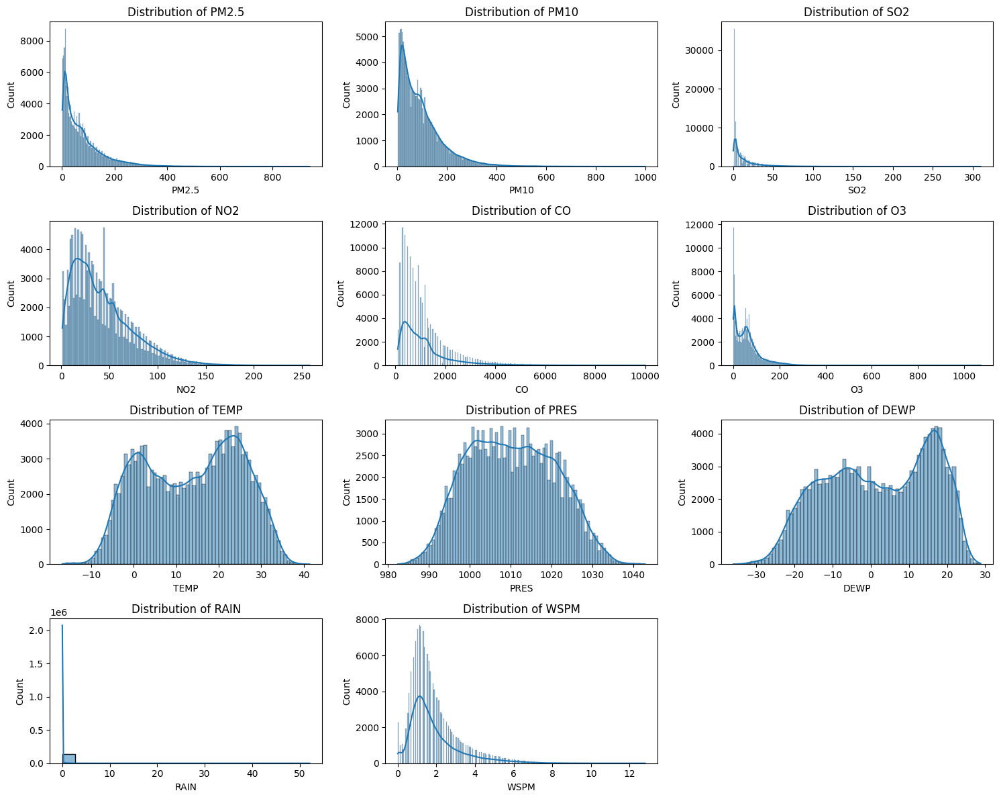

In [33]:
numerical_cols = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']


plt.figure(figsize=(15, 12))
for i, col in enumerate(numerical_cols):
    plt.subplot(4, 3, i + 1)
    sns.histplot(df[col].dropna(), kde=True)  # Drop NaN for plotting
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

this histogram visualize the distribution shap

 Plot box plots for each numerical feature to identify outliers

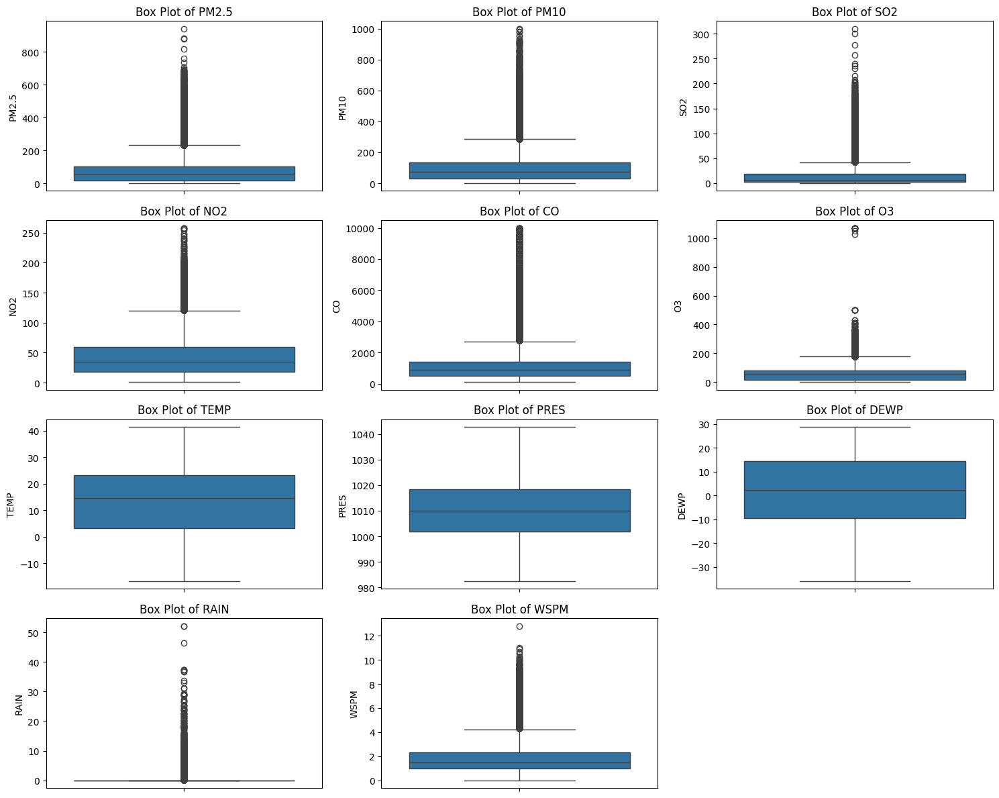

In [34]:

plt.figure(figsize=(15, 12))
for i, col in enumerate(numerical_cols):
    plt.subplot(4, 3, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Box Plot of {col}')
plt.tight_layout()
plt.show()

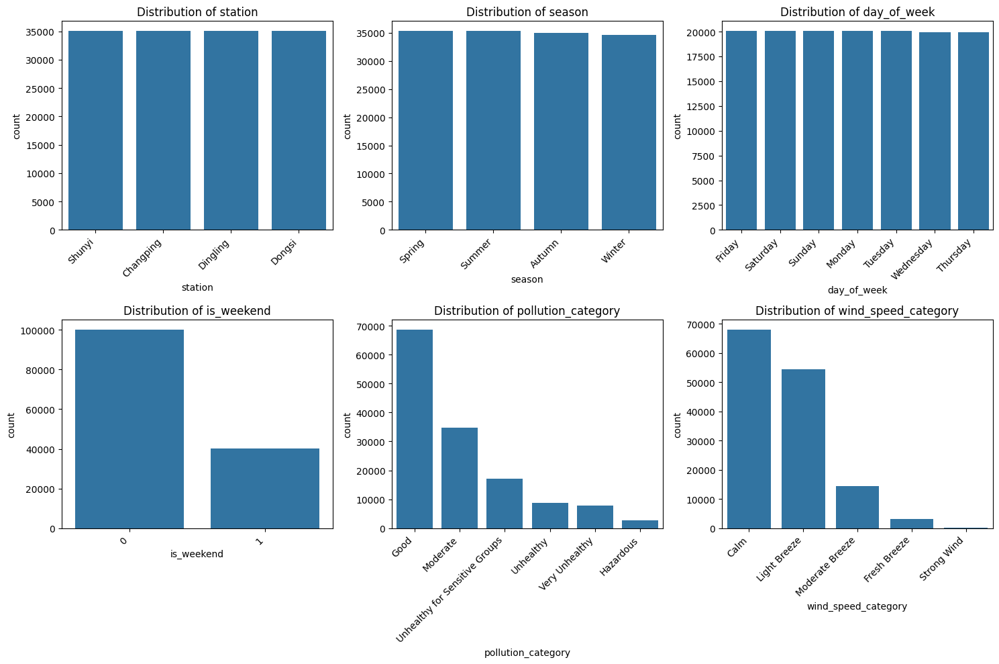

In [35]:
categorical_cols = ['station', 'season', 'day_of_week', 'is_weekend', 'pollution_category', 'wind_speed_category']

plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_cols):
    plt.subplot(2, 3, i + 1)
    sns.countplot(x=df[col], order=df[col].value_counts().index) # Order by frequency
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

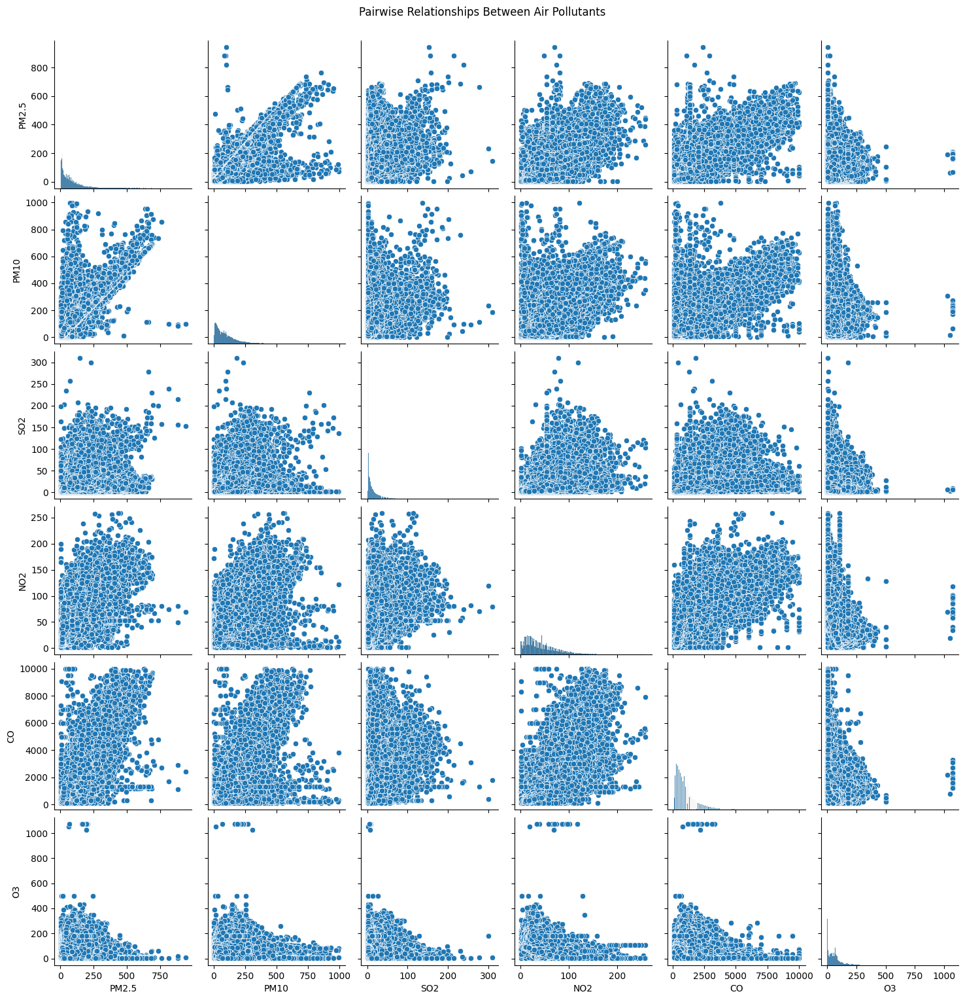

In [36]:
pollutant_cols = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Create a pair plot of the pollutant columns
sns.pairplot(df[pollutant_cols])
plt.suptitle("Pairwise Relationships Between Air Pollutants", y=1.02)
plt.show()

Pair plots analys relation ship between polltant.
1- PM2.5 vs PM10 appear strong positive correlation that reflect that they have same common source and affected by atmospheric condition.
2- NO2 VS CO have also same positive correlation as they mostly come from same source for example combustion processes.
3- PM2.5 VS SO2 postive correlation s sulfur dioxide is ofen produced from burning fossil fuels similar source of paricular matter industrial or combustion sources.
4- PM2.5VS O3  and NO2 vs o3 and are week relation or negative, At higher NO2 levels, ozone might even be suppressed in urban areas due to titration reactions, while downwind, it can contribute to ozone formation.

step2 : Bivariate Analysis - Pollutants vs. Meteorological Variables

we can see the visualization between pollutent PM2.5 and each meteorological variables(TEMP,PRES,DEWP,RAIN, WSPM) BY USING BOX PLOTS, SCATTER PLOTS.


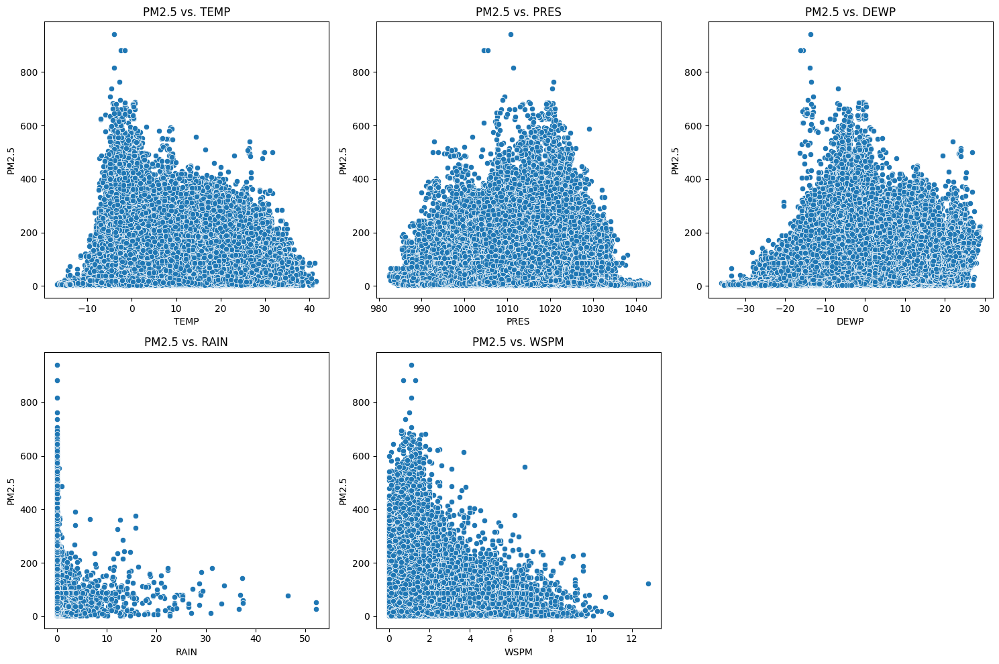

In [37]:
meteorological_cols = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

plt.figure(figsize=(15, 10))
for i, col in enumerate(meteorological_cols):
    plt.subplot(2, 3, i + 1)
    sns.scatterplot(x=df[col], y=df['PM2.5'])
    plt.title(f'PM2.5 vs. {col}')
    plt.xlabel(col)
    plt.ylabel('PM2.5')
plt.tight_layout()
plt.show()

Observation:
- **Temperature and Dew Point:** The relationship with PM2.5 is complex, with a wide range of PM2.5 values at lower temperatures and dew points. Higher values seem to be associated with lower max PM2.5.
**Pressure:** Pressure doesn't seem to have a strong linear effect on PM2.5.
Rainfall: Rain might have a slight cleaning effect, reducing the highest PM2.5 levels, but the effect is not very pronounced in these plots.
**Wind Speed:** Wind speed has the most apparent effect, with higher wind speeds associated with lower PM2.5 levels due to increased pollutant dispersion.

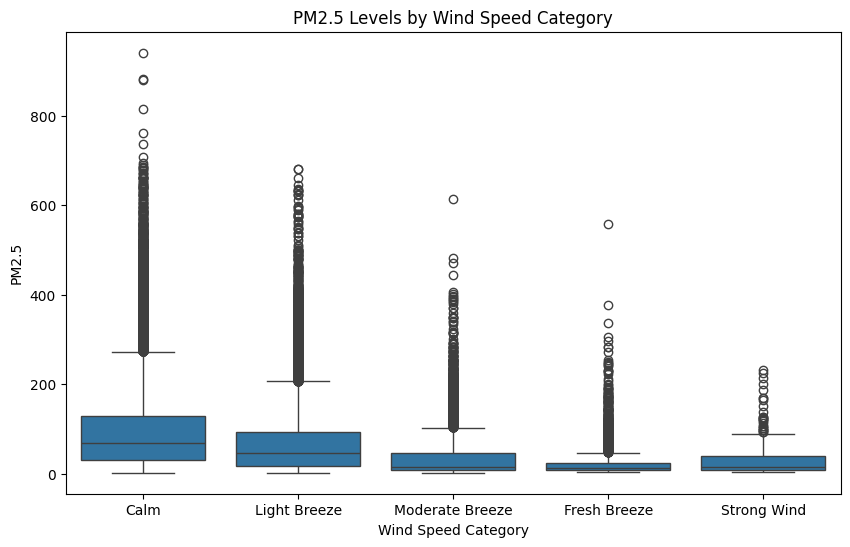

In [38]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='wind_speed_category', y='PM2.5', data=df, order=['Calm', 'Light Breeze', 'Moderate Breeze', 'Fresh Breeze', 'Strong Wind'])
plt.title('PM2.5 Levels by Wind Speed Category')
plt.xlabel('Wind Speed Category')
plt.ylabel('PM2.5')
plt.show()

what we're seeing is that when the wind is calm or just a light breeze, the levels of PM2.5 tend to be higher and more variable. But as the wind picks up to a moderate, fresh, or even strong speed, the average PM2.5 concentration goes down, and the air quality becomes more consistent. However, even with stronger winds, we can still see some spikes in pollution.

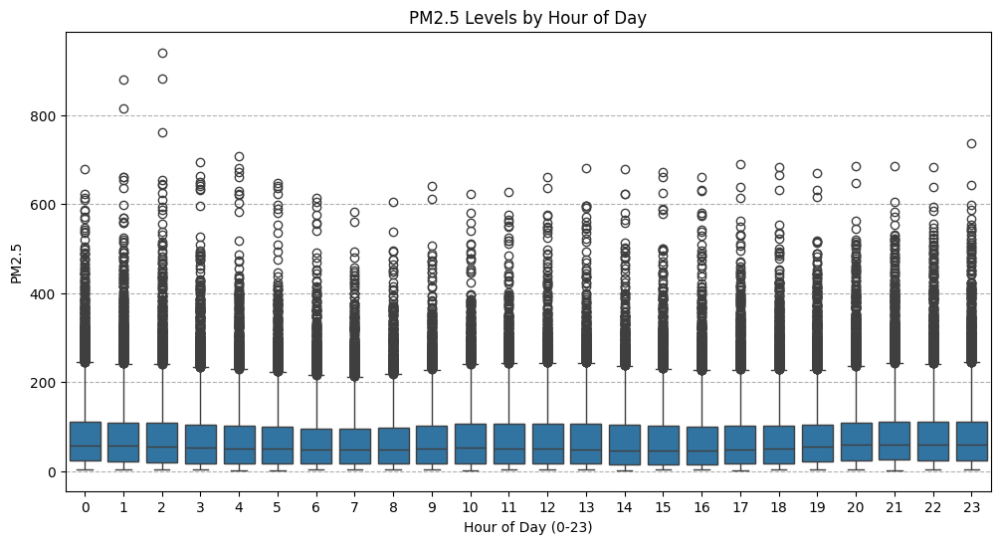

In [39]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='hour_of_day', y='PM2.5', data=df)
plt.title('PM2.5 Levels by Hour of Day')
plt.xlabel('Hour of Day (0-23)')
plt.ylabel('PM2.5')
plt.xticks(range(0, 24))
plt.grid(axis='y', linestyle='--')
plt.show()

try to see the relation betweeen PM25 and tempreture

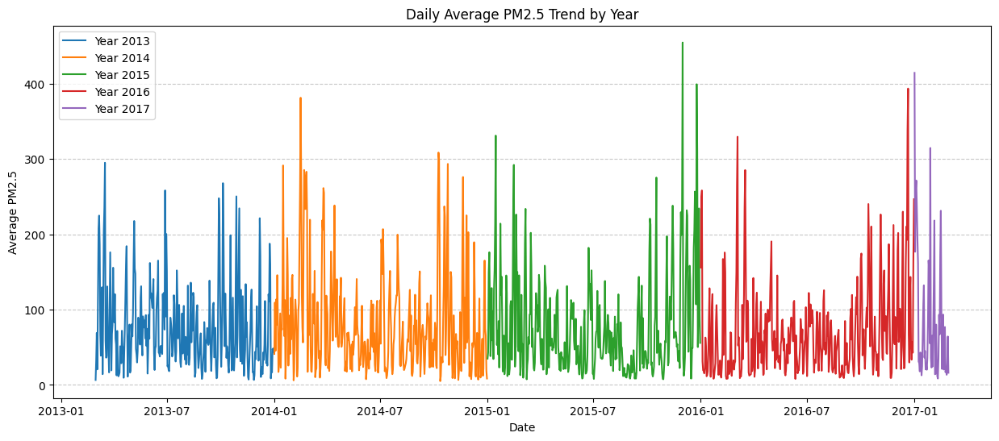

In [40]:
plt.figure(figsize=(15, 6))
for year in df['year'].unique():
    year_data = df[df['year'] == year]
    daily_avg = year_data.groupby(year_data['datetime'].dt.date)['PM2.5'].mean()
    plt.plot(daily_avg.index, daily_avg.values, label=f'Year {year}')

plt.title('Daily Average PM2.5 Trend by Year')
plt.xlabel('Date')
plt.ylabel('Average PM2.5')
plt.legend()
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.show()

PM2.5 levels in Beijing exhibit a clear seasonal pattern, with higher pollution generally occurring during the autumn and winter months and lower pollution during spring and summer.


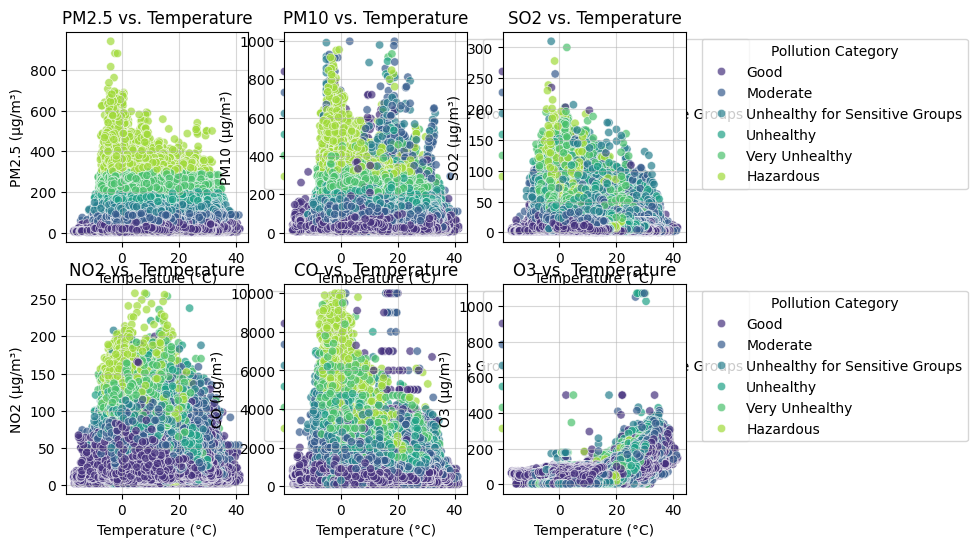

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

pollutant_cols = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

plt.figure(figsize=(8, 6))
for i, col in enumerate(pollutant_cols):
    plt.subplot(2, 3, i + 1)
    sns.scatterplot(data=df, x='TEMP', y=col, hue='pollution_category', palette='viridis', alpha=0.7)
    plt.title(f'{col} vs. Temperature')
    plt.xlabel('Temperature (°C)')
    plt.ylabel(f'{col} (µg/m³)') # Add unit to y-axis label for clarity
    plt.legend(title="Pollution Category", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(alpha=0.5)  # Add a subtle grid
plt.tight_layout()
plt.show()

Scatter Plot to observe the relation between PM10 vs WSPM

Higher wind speeds may disperse PM10 particles, leading to lower concentrations.


As the temperature increases, the points tend to shift towards the 'Good' and 'Moderate' pollution categories, and the frequency of very high PM10, co,no, No2 values seems to decrease.onthe On the contrary a positive trend between temperature and higher Ozone levels, especially in the mid to high-temperature range.


Pie Charts: Average Pollutant Contribution by Station

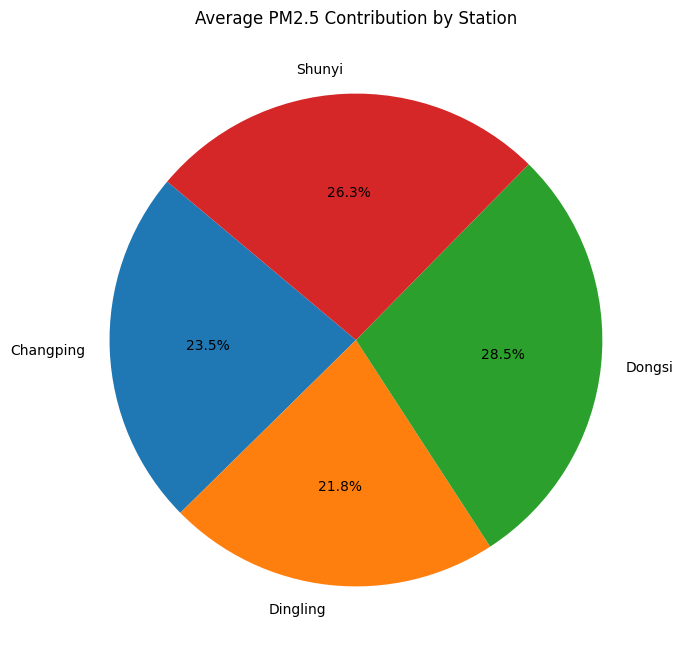

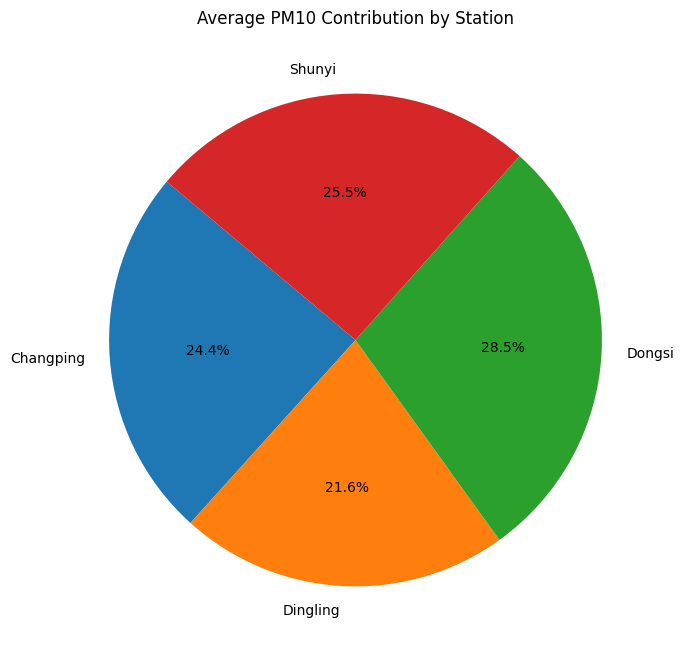

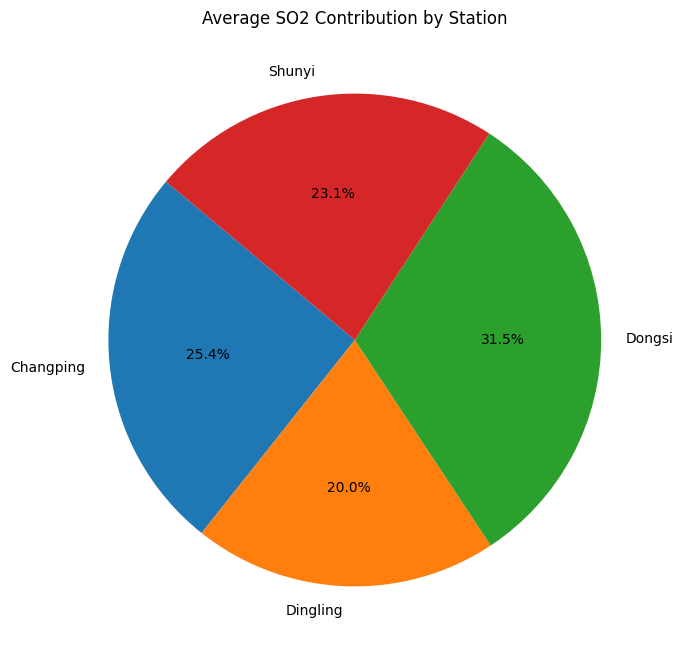

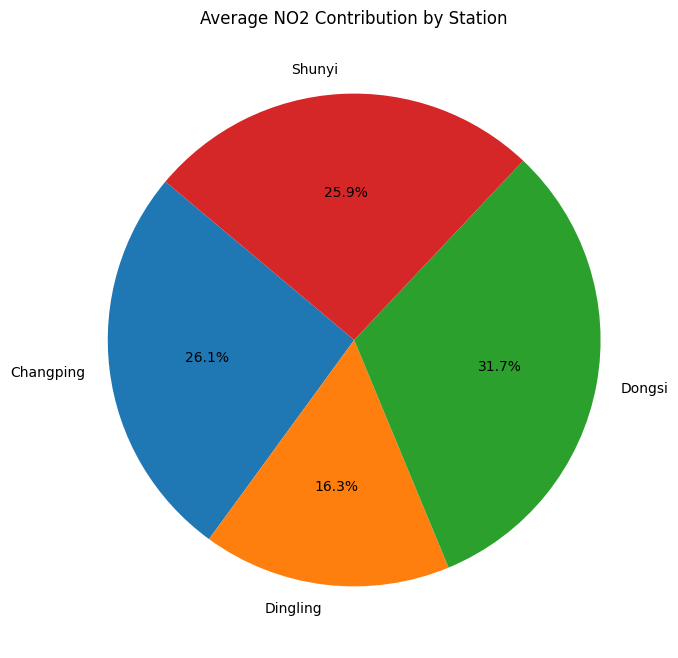

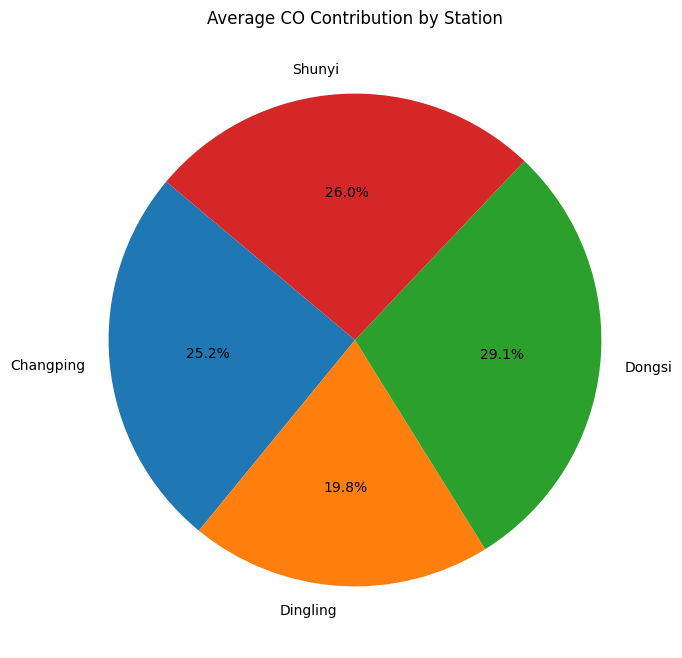

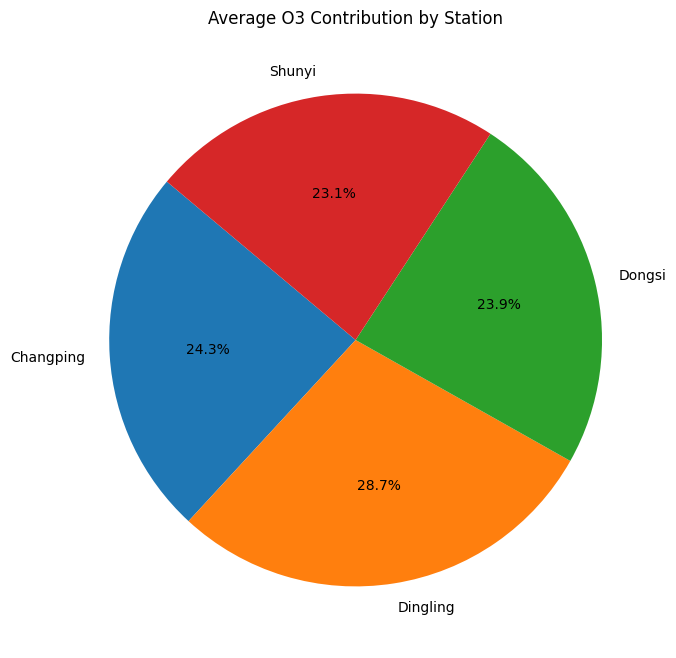

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

pollutant_cols = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

for pollutant in pollutant_cols:
    plt.figure(figsize=(8, 8))
    station_avg = df.groupby('station')[pollutant].mean()
    plt.pie(station_avg, labels=station_avg.index, autopct='%1.1f%%', startangle=140)
    plt.title(f'Average {pollutant} Contribution by Station')
    plt.show()

Scatter Plot to observe the relation between RAIN vs PM2.5

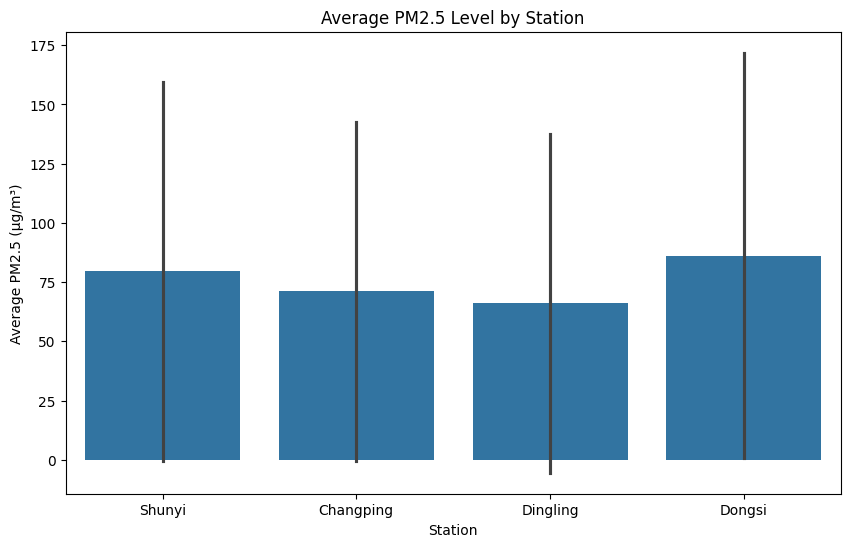

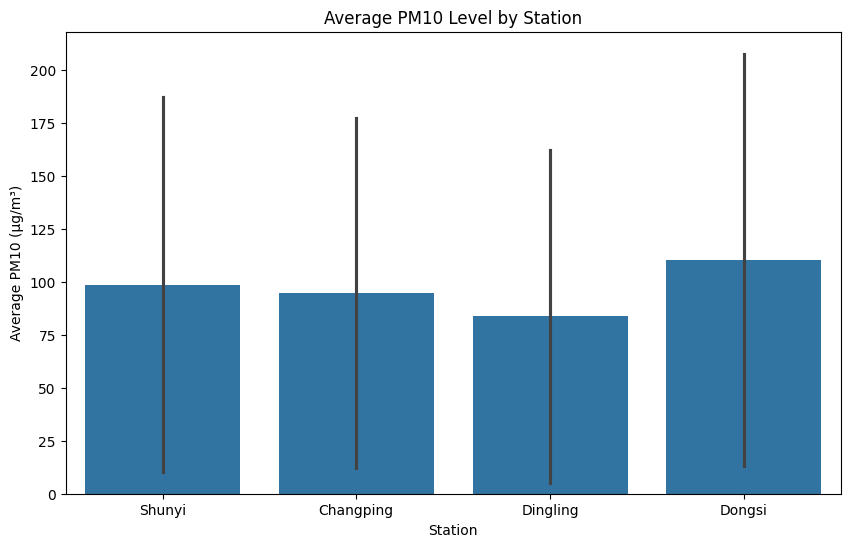

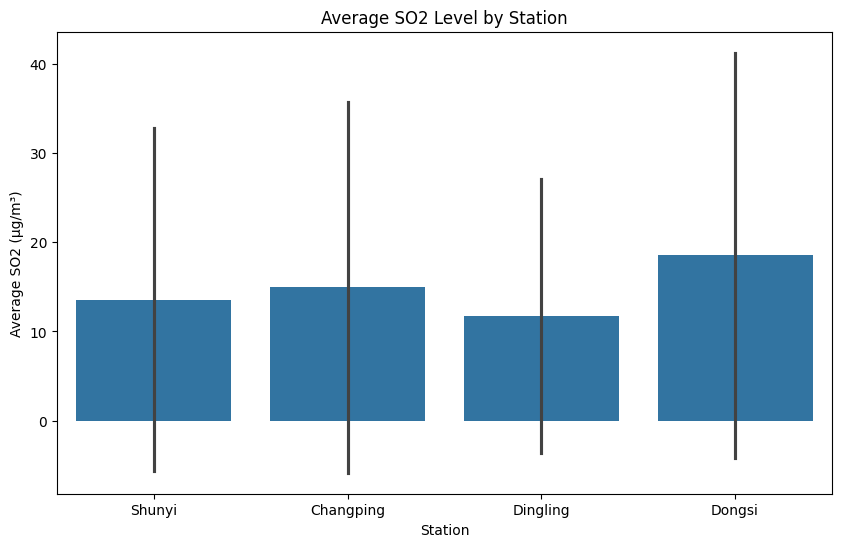

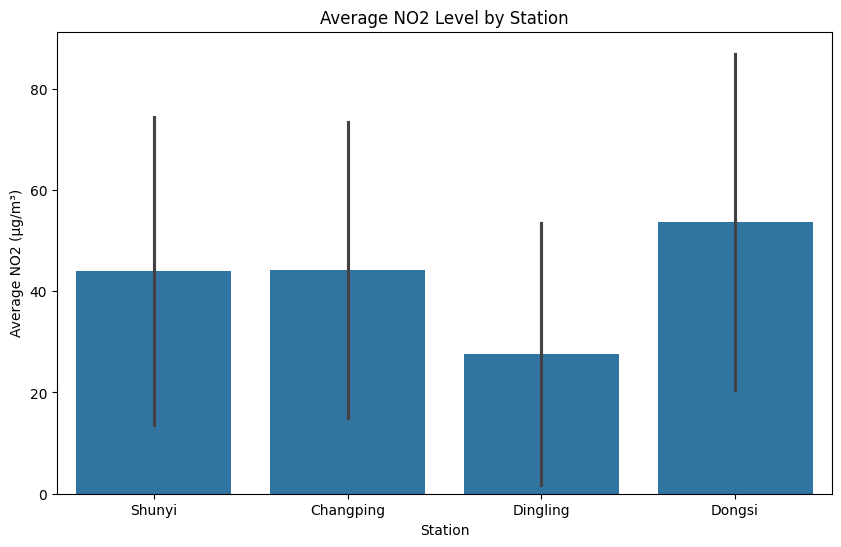

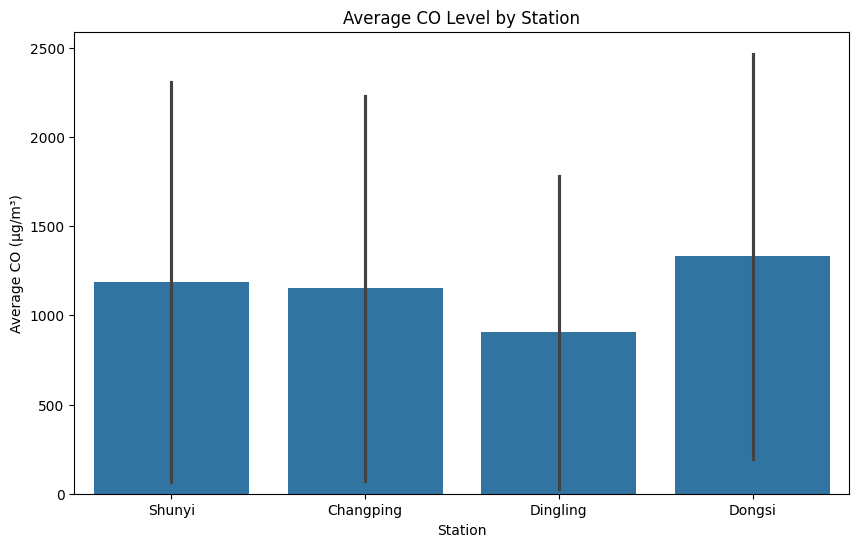

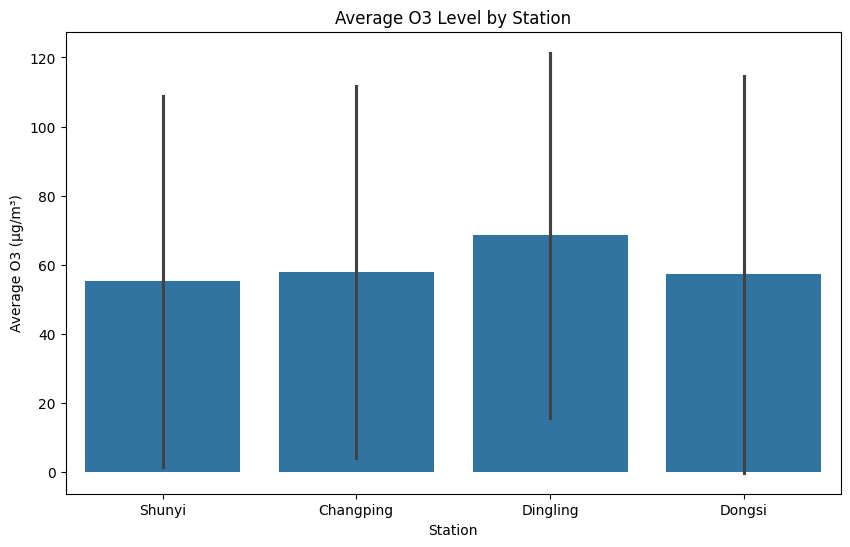

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

pollutant_cols = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

for pollutant in pollutant_cols:
    plt.figure(figsize=(10, 6))
    sns.barplot(x='station', y=pollutant, data=df, errorbar='sd')  # Show standard deviation as error bars
    plt.title(f'Average {pollutant} Level by Station')
    plt.xlabel('Station')
    plt.ylabel(f'Average {pollutant} (µg/m³)')  # Add unit
    plt.show()

line plots showing the daily trends for PM2.5, PM10, SO2, NO2, CO, and O3.

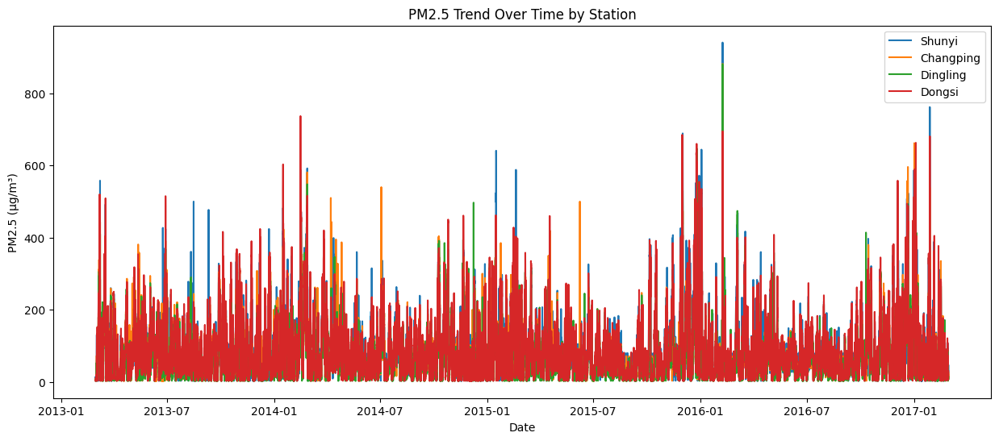

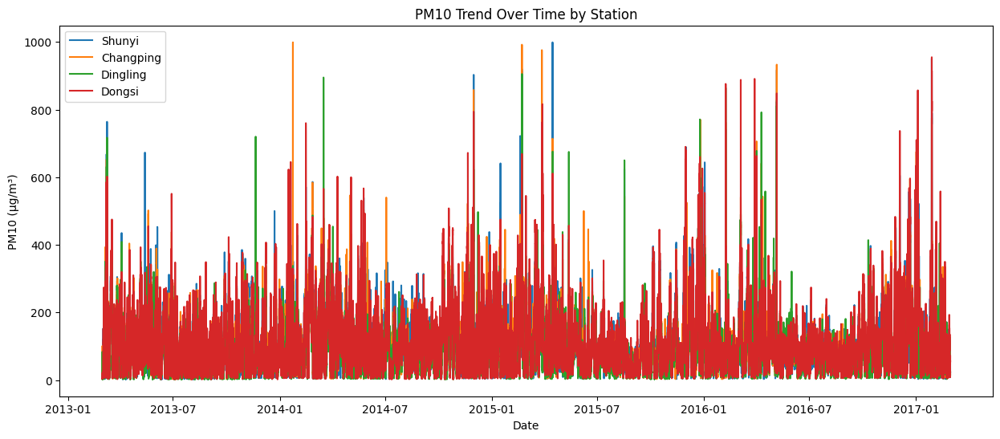

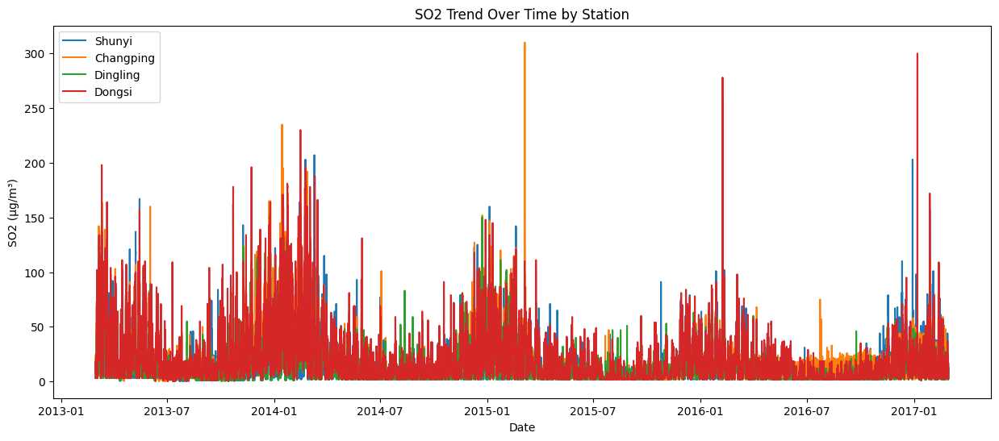

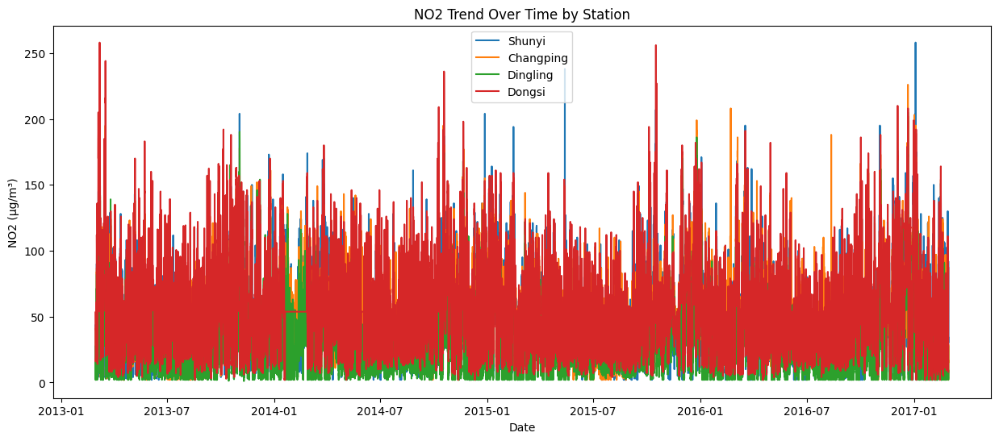

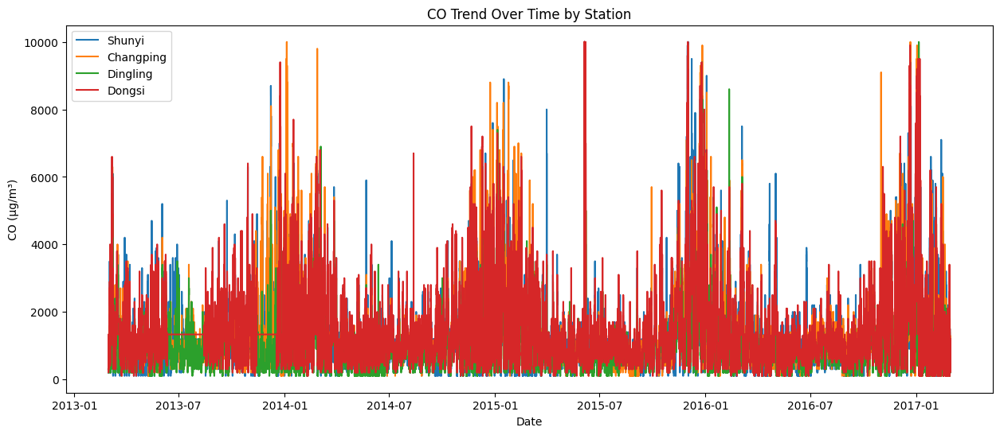

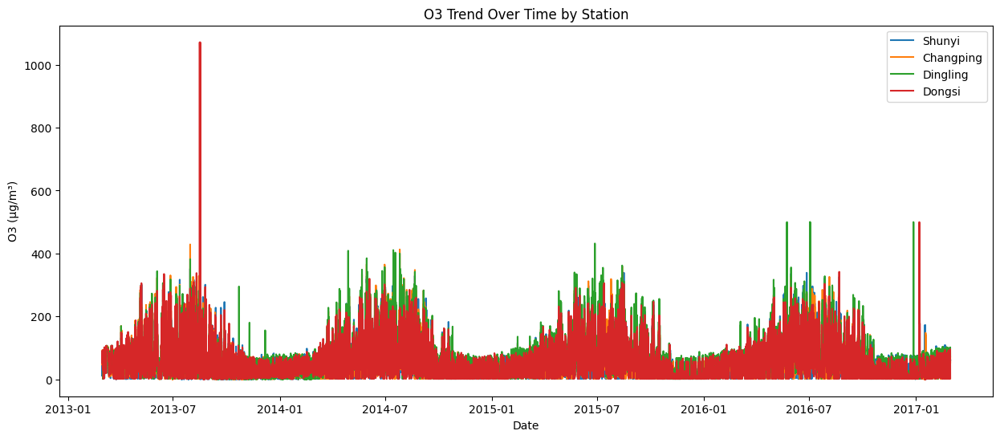

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

pollutant_cols = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

for pollutant in pollutant_cols:
    plt.figure(figsize=(15, 6))
    for station in df['station'].unique():
        station_data = df[df['station'] == station]
        sns.lineplot(x='datetime', y=pollutant, data=station_data, label=station)
    plt.title(f'{pollutant} Trend Over Time by Station')
    plt.xlabel('Date')
    plt.ylabel(f'{pollutant} (µg/m³)')  # Add unit
    plt.legend()
    plt.show()

These plots illustrate how the average levels of each pollutant fluctuate on a day-to-day basis over the time period of the dataset, revealing short-term variability and potential longer-term tendencies for each pollutant. Comparing the daily trends across different pollutants can highlight if they tend to change in similar patterns or exhibit unique daily dynamics.

Define AQI breakpoints and categories (using simplified US EPA standards for example)

Shunyi: Shows a relatively high frequency of 'Unhealthy' and 'Very Unhealthy' AQI categories compared to the other stations. 'Good' and 'Moderate' levels are less frequent here.
Changping: Exhibits a more balanced distribution, with a significant number of data points in the 'Moderate' and 'Unhealthy' categories. The frequency of 'Good' AQI is also notable.
Dingling: Appears to have the highest frequency of 'Good' and 'Moderate' AQI levels among the four stations. The frequencies of 'Unhealthy' and 'Very Unhealthy' are comparatively lower.
Dongsi: Shows a high frequency of 'Unhealthy' AQI, similar to Shunyi, but also has a substantial number of 'Moderate' readings. 'Good' AQI is the least frequent at this station.

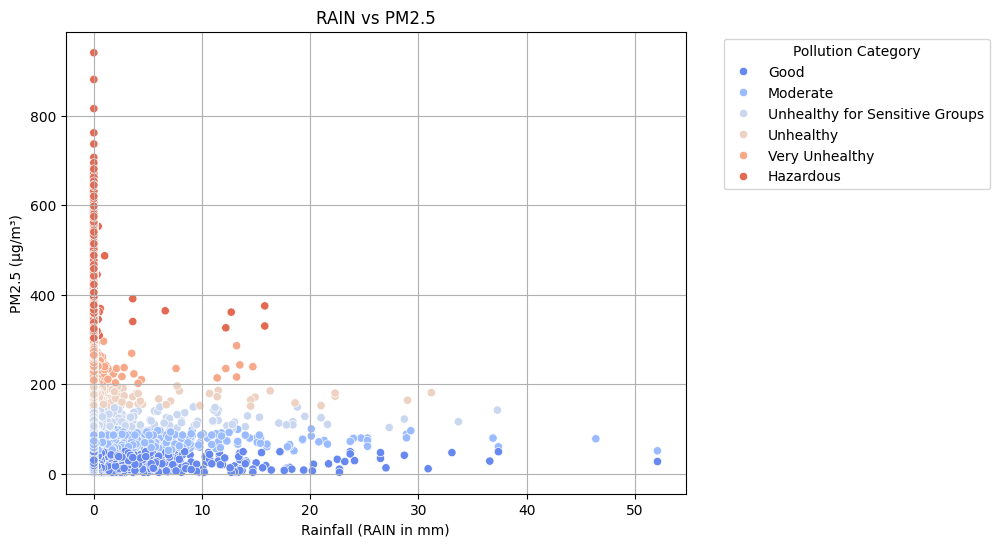

In [45]:
# Scatter plot: RAIN vs PM2.5
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='RAIN', y='PM2.5', hue='pollution_category', palette='coolwarm')
plt.title("RAIN vs PM2.5")
plt.xlabel("Rainfall (RAIN in mm)")
plt.ylabel("PM2.5 (µg/m³)")
plt.legend(title="Pollution Category", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.show()

 The impact of rainfall on PM2.5 levels. Rainfall often reduces PM2.5 through a "washout" effect.

Line plot opserve relation between PM2.5 and PM10 vs season

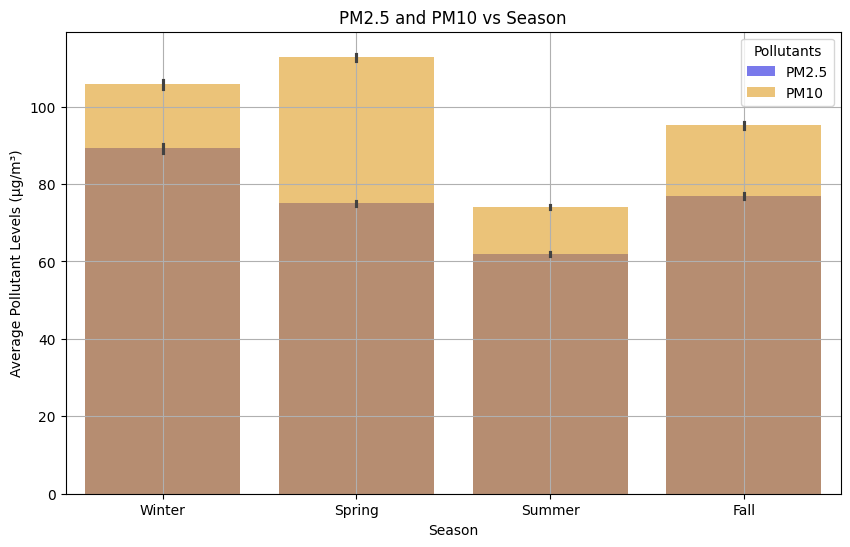

In [46]:
# Add a 'season' column based on the 'month'
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df['season'] = df['month'].apply(get_season)

# Bar plot: PM2.5 and PM10 vs season
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='season', y='PM2.5', color='blue', alpha=0.6, label='PM2.5', order=['Winter', 'Spring', 'Summer', 'Fall'])
sns.barplot(data=df, x='season', y='PM10', color='orange', alpha=0.6, label='PM10', order=['Winter', 'Spring', 'Summer', 'Fall'])
plt.title("PM2.5 and PM10 vs Season")
plt.xlabel("Season")
plt.ylabel("Average Pollutant Levels (µg/m³)")
plt.legend(title="Pollutants")
plt.grid()
plt.show()

iifferences in the average PM2.5 and PM10 levels across the seasons. higher levels in winter due to heating and stable atmospheric conditions.

pollutant tless in summer and higher in spring

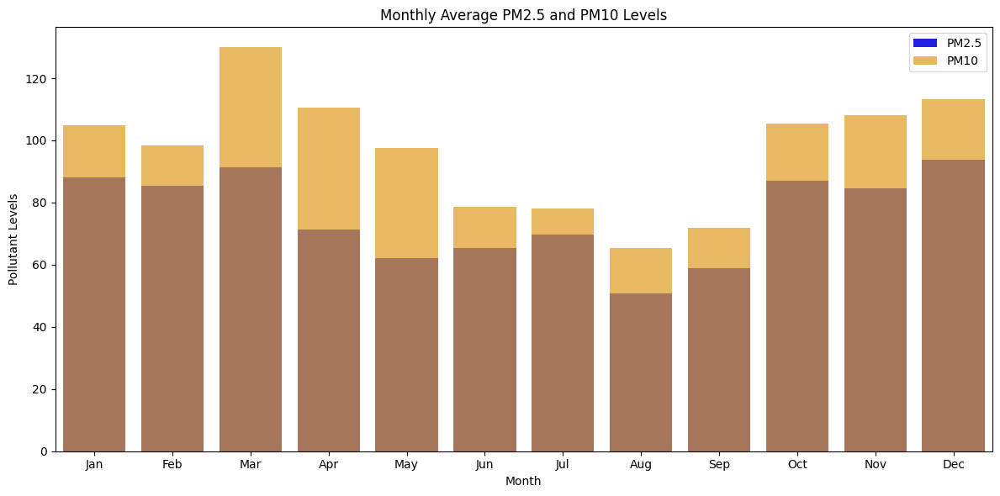

In [47]:
# Aggregate monthly averages for PM2.5 and PM10
monthly_avg = df.groupby('month')[['PM2.5', 'PM10']].mean().reset_index()

# Plot PM2.5 and PM10 monthly averages
plt.figure(figsize=(12, 6))
sns.barplot(x='month', y='PM2.5', data=monthly_avg, color='blue', label='PM2.5')
sns.barplot(x='month', y='PM10', data=monthly_avg, color='orange', alpha=0.7, label='PM10')
plt.title('Monthly Average PM2.5 and PM10 Levels')
plt.xlabel('Month')
plt.ylabel('Pollutant Levels')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.tight_layout()
plt.show()

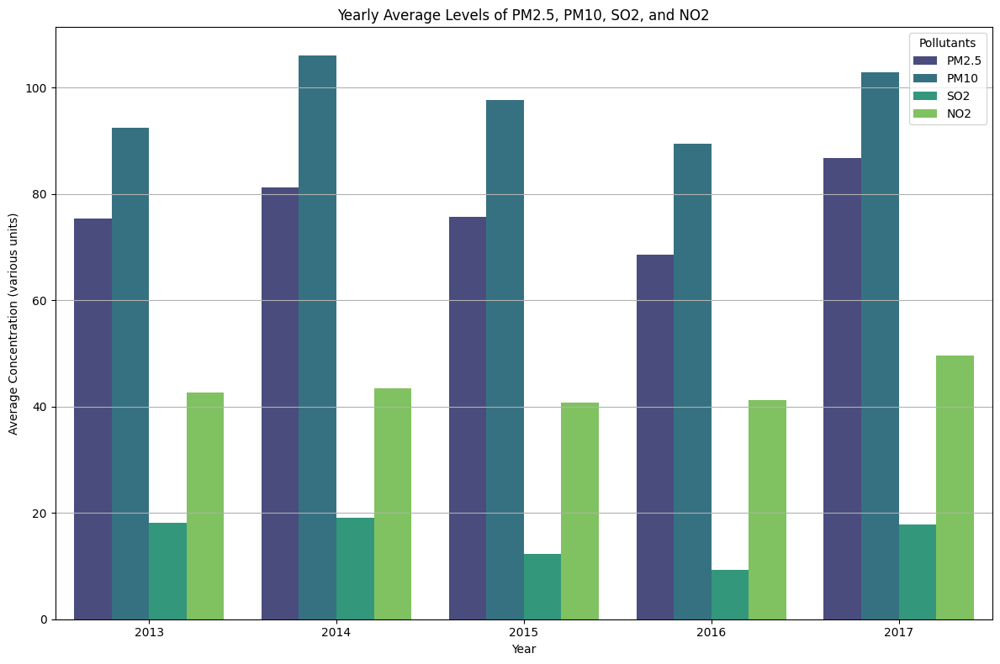

In [48]:
# Aggregate yearly averages for the specified pollutants
yearly_avg = df.groupby('year')[['PM2.5', 'PM10', 'SO2', 'NO2']].mean().reset_index()

# Melt the data for easier plotting
yearly_avg_melted = yearly_avg.melt(id_vars='year', var_name='Pollutant', value_name='Average Level')

# Bar plot: All pollutants per year
plt.figure(figsize=(12, 8))
sns.barplot(data=yearly_avg_melted, x='year', y='Average Level', hue='Pollutant', palette='viridis')
plt.title('Yearly Average Levels of PM2.5, PM10, SO2, and NO2')
plt.xlabel('Year')
plt.ylabel('Average Concentration (various units)')
plt.legend(title='Pollutants')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

 this pargraph show the change of level of PM2.F and PM10 Over the year which increase in winter monthes and decrease in summer monthes

explain each pollutant over the month
PM25:in winter Winter months (December, January, February) higher PM2.5 levels due to low tempreture (colde) so heating activity increase use cool biomass which contribute PM25.
on the other side in summer Summer months (June, July, August) generally have lower PM2.5 levels.


. PM10 (Coarse Particulate Matter)
Months with High Levels:Dry months ( March, April, May) due to
Dust Storms,
Construction Activities,Agricultural Practices

Months with Low Levels:Rainy months ( July, August, September) because of
Rainfall, Moist Ground

SO2 : Months with High Levels:

Winter months (November, December, January) often see higher SO2 due to:
Fossil Fuel Combustion
Temperature Inversions: Trap SO2 emissions near the ground.
Industrial Emissions: Power plants and factories may operate at higher capacities during winter.
Months with Low Levels:

Summer months (une, July, August) generally have lower SO2 levels:
Photochemical Reactions: SO2 reacts with sunlight and other chemicals, reducing its presence.

Months with High Levels:

Winter months ( December, January, February) see higher NO2 levels because:
Vehicular Emissions:
Temperature Inversions: Trap NO2 close to the surface.
Heating Activities: Combustion of natural gas and other fuels releases NO2.
Months with Low Levels:

Summer months ( June, July, August) typically have lower NO2 levels:
Photochemical Reactions: Sunlight breaks down NO2 into other compounds.

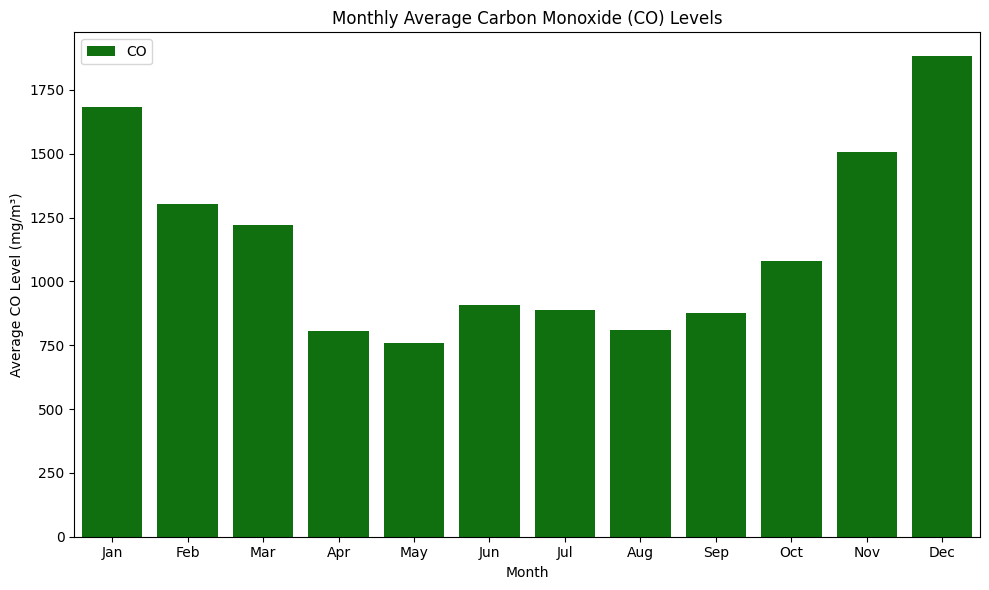

In [49]:
# Aggregate monthly averages for CO
monthly_avg_co = df.groupby('month')[['CO']].mean().reset_index()

# Melt the data for easier plotting (though not strictly necessary for a single pollutant)
monthly_avg_co_melted = monthly_avg_co.melt(id_vars='month', var_name='Pollutant', value_name='Average Level')

# Bar plot: Monthly average CO levels
plt.figure(figsize=(10, 6))
sns.barplot(data=monthly_avg_co_melted, x='month', y='Average Level', color='green', label='CO')
plt.title('Monthly Average Carbon Monoxide (CO) Levels')
plt.xlabel('Month')
plt.ylabel('Average CO Level (mg/m³)')  # Assuming CO is in mg/m³
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.tight_layout()
plt.show()

Check for outliers in the pollutant columns by using Interquartile Range (IQR) Method by measuring the spread between the first quartile Q1 and third quartile Q3 that any data bleow Q1 AND ABOVE Q3 is considered an outlier.


Descriptive Statistics Before Clipping:
               PM2.5           PM10            SO2            NO2  \
count  140256.000000  140256.000000  140256.000000  140256.000000   
mean       75.693785      96.867841      14.702925      42.343965   
std        77.819432      87.656073      19.851076      31.236748   
min         2.000000       2.000000       0.285600       1.026500   
25%        18.000000      32.000000       2.000000      18.000000   
50%        52.000000      75.000000       7.000000      35.000000   
75%       104.000000     134.000000      18.000000      59.000000   
max       941.000000     999.000000     310.000000     258.000000   

                  CO             O3  
count  140256.000000  140256.000000  
mean     1143.582632      59.725083  
std      1068.954996      54.737822  
min       100.000000       0.214200  
25%       500.000000      17.000000  
50%       900.000000      51.000000  
75%      1400.000000      82.000000  
max     10000.000000    1071.0000

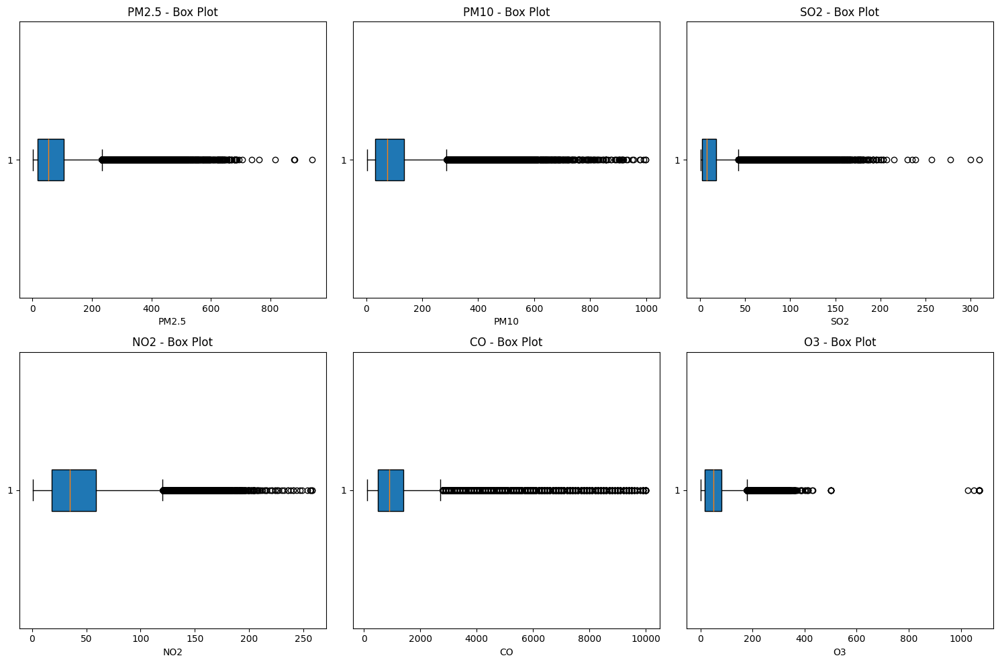


Outlier Summary (IQR Method):
PM2.5: 7065 outliers
PM10: 5258 outliers
SO2: 11721 outliers
NO2: 3284 outliers
CO: 10011 outliers
O3: 6106 outliers


In [50]:
# List of pollutant columns to check for outliers
pollutant_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Function to detect outliers using IQR
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound

    # Display descriptive statistics before clipping
print("\nDescriptive Statistics Before Clipping:")
print(df[pollutant_columns].describe())

# Visualize outliers using box plots
plt.figure(figsize=(15, 10))
for i, col in enumerate(pollutant_columns, 1):
    plt.subplot(2, 3, i)
    plt.boxplot(df[col].dropna(), vert=False, patch_artist=True)
    plt.title(f'{col} - Box Plot')
    plt.xlabel(col)

plt.tight_layout()
plt.show()

# Detect and count outliers for each pollutant column
outlier_summary = {}
for col in pollutant_columns:
    outliers, lower_bound, upper_bound = detect_outliers_iqr(df, col)
    outlier_summary[col] = len(outliers)

    # Clip the outliers to the lower and upper bounds
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

# Display the outlier summary
print("\nOutlier Summary (IQR Method):")
for col, count in outlier_summary.items():
    print(f"{col}: {count} outliers")

# Step 5: Save the Cleaned and Enhanced Dataset

In [51]:
os.makedirs('/content/drive/MyDrive/data sets/Merged cities', exist_ok=True)


In [52]:
import os
print(os.path.exists('/content/drive/MyDrive/data sets/Merged cities/analyzed_data'))


False


In [53]:
from google.colab import drive
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

# Define the save path
save_path = '/content/drive/MyDrive/data sets/Merged cities/analyzed_data.csv'

# Save your processed dataset (replace 'df' with your DataFrame)
df.to_csv(save_path, index=False)

print(f"Analyzed dataset saved successfully to '{save_path}'.")




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Analyzed dataset saved successfully to '/content/drive/MyDrive/data sets/Merged cities/analyzed_data.csv'.


In [54]:
print("\nRemaining missing values after imputation:")
print(df.isnull().sum())


Remaining missing values after imputation:
No                     0
year                   0
month                  0
day                    0
hour                   0
PM2.5                  0
PM10                   0
SO2                    0
NO2                    0
CO                     0
O3                     0
TEMP                   0
PRES                   0
DEWP                   0
RAIN                   0
wd                     0
WSPM                   0
station                0
datetime               0
season                 0
day_of_week            0
is_weekend             0
year_month             0
hour_of_day            0
pollution_category     0
wd_numeric             0
wind_speed_category    0
dtype: int64


# Display the first few rows of the enhanced dataset

In [55]:
print("\nFirst 5 rows of the enhanced dataset:")
print(df.head(5))


First 5 rows of the enhanced dataset:
   No  year  month  day  hour  PM2.5  PM10        SO2        NO2           CO  \
0   1  2013      3    1     0    3.0   6.0   3.000000   8.000000   300.000000   
1   2  2013      3    1     1   12.0  12.0   3.000000   7.000000   300.000000   
2   3  2013      3    1     2   14.0  14.0  13.572039   7.000000   200.000000   
3   4  2013      3    1     3   12.0  12.0   3.000000   5.000000  1187.063979   
4   5  2013      3    1     4   12.0  12.0   3.000000  43.908865   200.000000   

   ...  station            datetime  season  day_of_week  is_weekend  \
0  ...   Shunyi 2013-03-01 00:00:00  Spring       Friday           0   
1  ...   Shunyi 2013-03-01 01:00:00  Spring       Friday           0   
2  ...   Shunyi 2013-03-01 02:00:00  Spring       Friday           0   
3  ...   Shunyi 2013-03-01 03:00:00  Spring       Friday           0   
4  ...   Shunyi 2013-03-01 04:00:00  Spring       Friday           0   

  year_month  hour_of_day pollution_categ

##c) Statistical Analysis and Visualization

There is different analysis

1- Univariate Analysis: Visualizations (histograms, box plots, bar chart) for individual variables, including pollutant data and categorical features like site_type



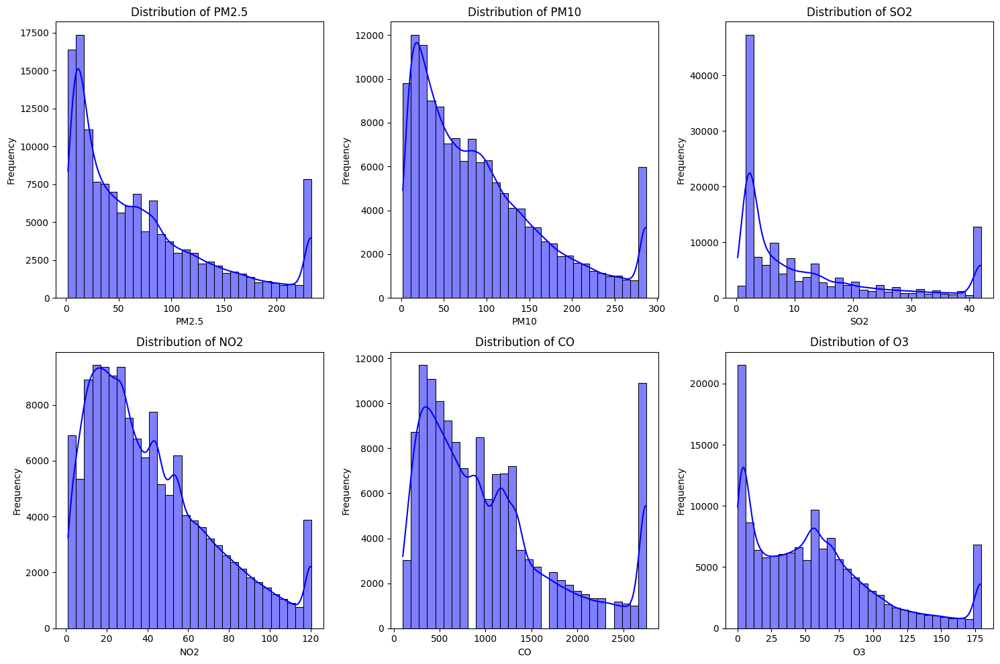

In [56]:
# Histograms for pollutant levels
pollutant_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
plt.figure(figsize=(15, 10))
for i, col in enumerate(pollutant_columns, 1):
    plt.subplot(2, 3, i)
    sns.histplot(df[col], kde=True, bins=30, color='blue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


The collection of visualizations explores air quality in Beijing from 2013-2017, revealing seasonal patterns of higher pollution in colder months and lower in warmer ones, along with diurnal variations showing increased pollution overnight. Relationships between pollutants indicate common sources, while meteorological factors like wind speed tend to reduce pollution. Different stations exhibit varying AQI distributions, with rural Dingling generally better and industrial Shunyi often worse.

 bar chart showing the count of observations for each station

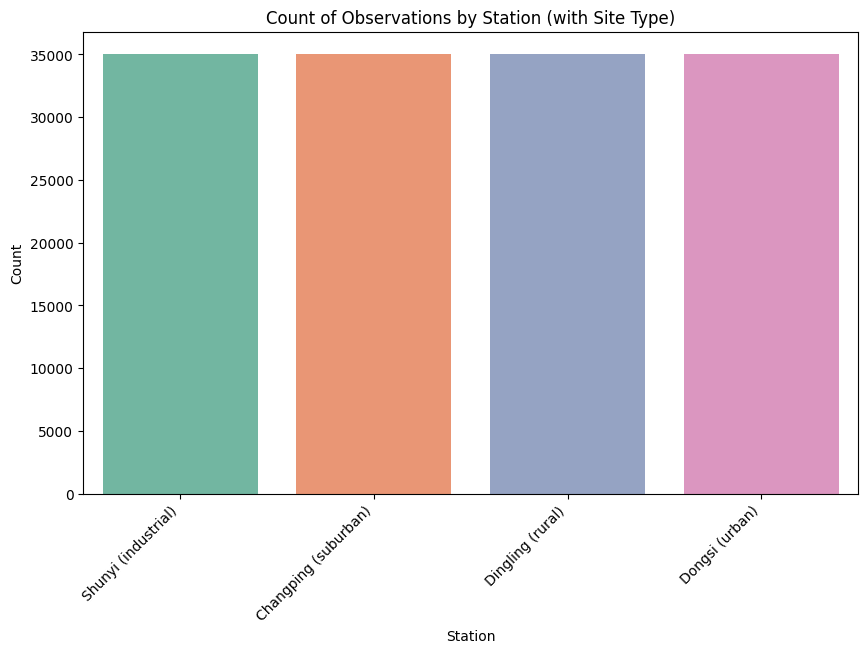

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

site_types = {
    'Dongsi': 'urban',
    'Changping': 'suburban',
    'Dingling': 'rural',
    'Shunyi': 'industrial'
}

plt.figure(figsize=(10, 6))
sns.countplot(x='station', data=df, palette='Set2')
plt.title('Count of Observations by Station (with Site Type)')
plt.xlabel('Station')
plt.ylabel('Count')
plt.xticks(
    ticks=range(len(df['station'].unique())),
    labels=[f"{station} ({site_types.get(station, 'Unknown')})" for station in df['station'].unique()],
    rotation=45, ha='right'
)
plt.show()

air quality distribution in the dataset

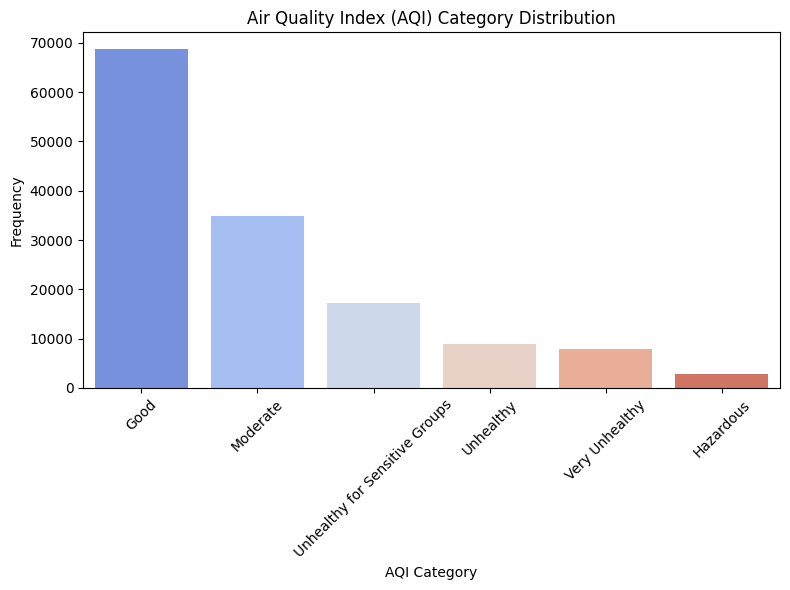

In [58]:
plt.figure(figsize=(8, 6))
sns.countplot(x='pollution_category', data=df, palette='coolwarm', order=df['pollution_category'].value_counts().index)
plt.title('Air Quality Index (AQI) Category Distribution')
plt.xlabel('AQI Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Bivariate Analysis

Correlation between pollutants and weather by using Heatmap

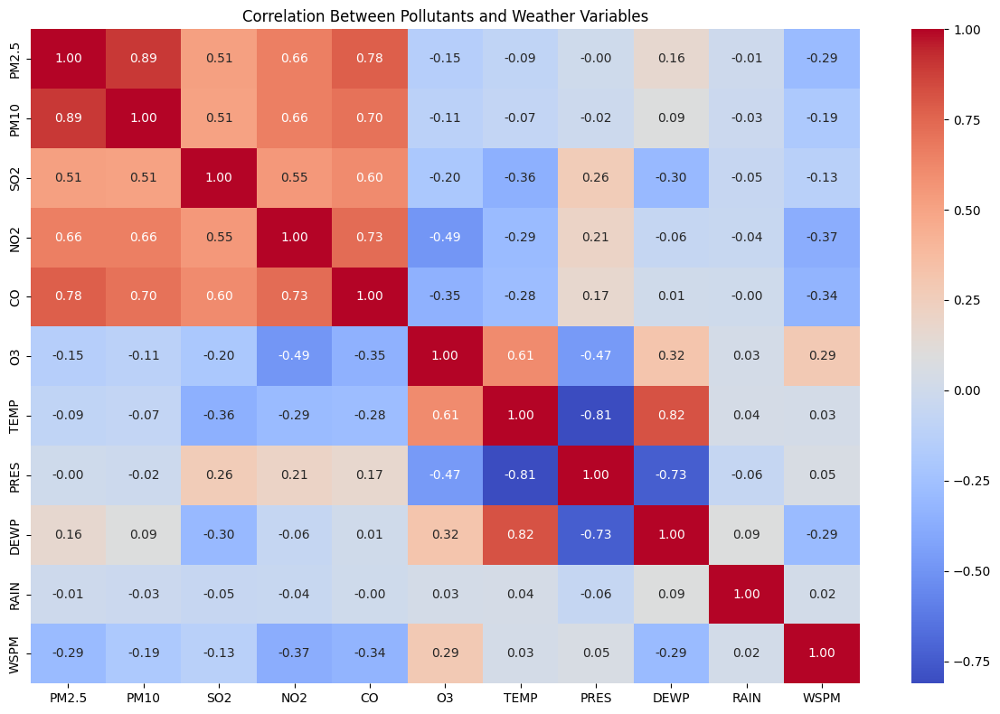

In [59]:

# Select pollutant and weather variables for correlation analysis
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']
weather = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Compute the correlation matrix
correlation_matrix = df[pollutants + weather].corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Between Pollutants and Weather Variables')
plt.tight_layout()
plt.show()

Temperature (TEMP):

Negative correlations with most pollutants: higher temperatures help disperse pollutants or reduce emissions from heating-related activities.
Positive correlation with O3 (0.60), as ozone formation increases with sunlight and heat.
----------------------
PM2.5 and PM10:

Strong positive correlation (0.90) indicates they often occur together.
Likely due to shared sources, such as vehicle emissions, construction dust, and industrial activities.
----------------------------------
SO2 and NO2:

Positive correlation (0.55) indicates they may have overlapping sources, such as industrial emissions and power generation.
-------------------
O3 with Other Pollutants:

Weak or negative correlations with most pollutants:
O3 and PM2.5 (-0.15).
O3 and NO2 (-0.49).
This reflects the fact that ozone formation often occurs under different conditions than those that generate particulate matter or combustion-related pollutants.
----------------------
Pollutants vs. Weather Variables
Temperature (TEMP):

Negative correlations with most pollutants:
PM2.5 and TEMP (-0.09).
PM10 and TEMP (-0.07).
CO and TEMP (-0.29).
Suggests higher temperatures help disperse pollutants or reduce emissions from heating-related activities.
Positive correlation with O3 (0.60), as ozone formation increases with sunlight and heat.
Pressure (PRES):

Weak or negative correlations with most pollutants:
PM2.5 and PRES (-0.00).
CO and PRES (-0.18).
Positive correlation with SO2 (0.27), possibly due to atmospheric conditions that trap SO2.
Dew Point (DEWP):

Positive correlations with particulates (PM2.5: 0.16, PM10: 0.09) and ozone (O3: 0.32).
Suggests higher humidity may enhance certain pollutant levels through condensation or chemical reactions.
Rainfall (RAIN):

Weak negative correlations with most pollutants:
PM2.5 and RAIN (-0.01).
PM10 and RAIN (-0.03).
Rain helps wash out pollutants, reducing their concentration in the air.
Wind Speed (WSPM):

Negative correlations with pollutants:
PM2.5 and WSPM (-0.29).
CO and WSPM (-0.33).
Wind disperses pollutants, reducing their concentration.
Positive correlation with O3 (0.29), as wind can transport ozone precursors.
Insights:
PM2.5 and PM10 are strongly correlated with each other and with CO, indicating common sources like combustion and dust.
O3 behaves differently, correlating positively with temperature and wind speed, reflecting its formation in sunny, warm conditions.
Rain and wind generally reduce pollutant levels, while temperature and humidity have mixed effects depending on the pollutant.
SO2 and NO2 correlations suggest industrial and combustion sources.
This heatmap provides valuable insights into how pollutants and weather variables interact, which can guide pollution control strategies. Let me know if you'd like further analysis!

 relationship between PM2.5 and PM10 across the four monitoring stations

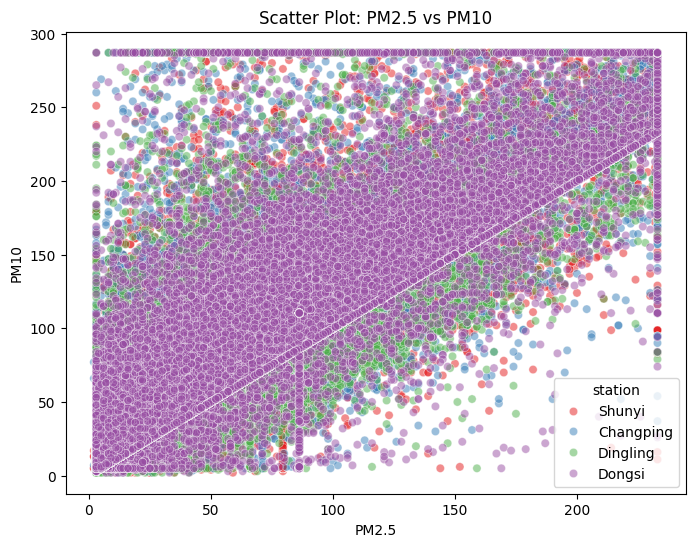

In [60]:
# Scatter plot: PM2.5 vs. PM10
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PM2.5', y='PM10', data=df, alpha=0.5, hue='station', palette='Set1')
plt.title('Scatter Plot: PM2.5 vs PM10')
plt.xlabel('PM2.5')
plt.ylabel('PM10')
plt.legend(title='station')
plt.show()

average PM2.5 levels over time

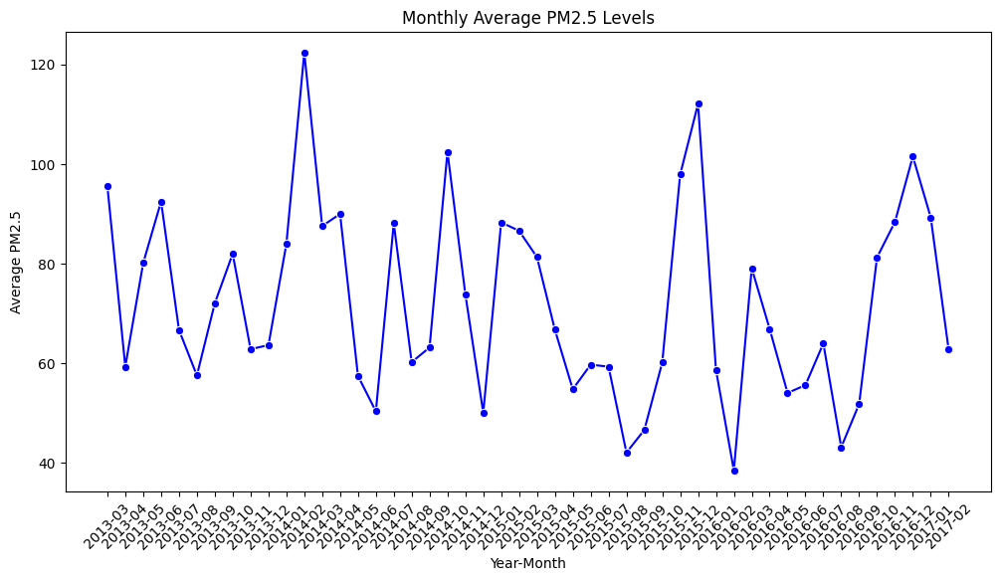

In [61]:
# Ensure year_month is converted to string for plotting compatibility
monthly_avg = df.groupby('year_month')['PM2.5'].mean().reset_index()
monthly_avg['year_month'] = monthly_avg['year_month'].astype(str)  # Convert to string

# Plot the line chart
plt.figure(figsize=(12, 6))
sns.lineplot(x='year_month', y='PM2.5', data=monthly_avg, marker='o', color='blue')
plt.title('Monthly Average PM2.5 Levels')
plt.xlabel('Year-Month')
plt.ylabel('Average PM2.5')
plt.xticks(rotation=45)
plt.show()

Relationship between temperature and pollutants

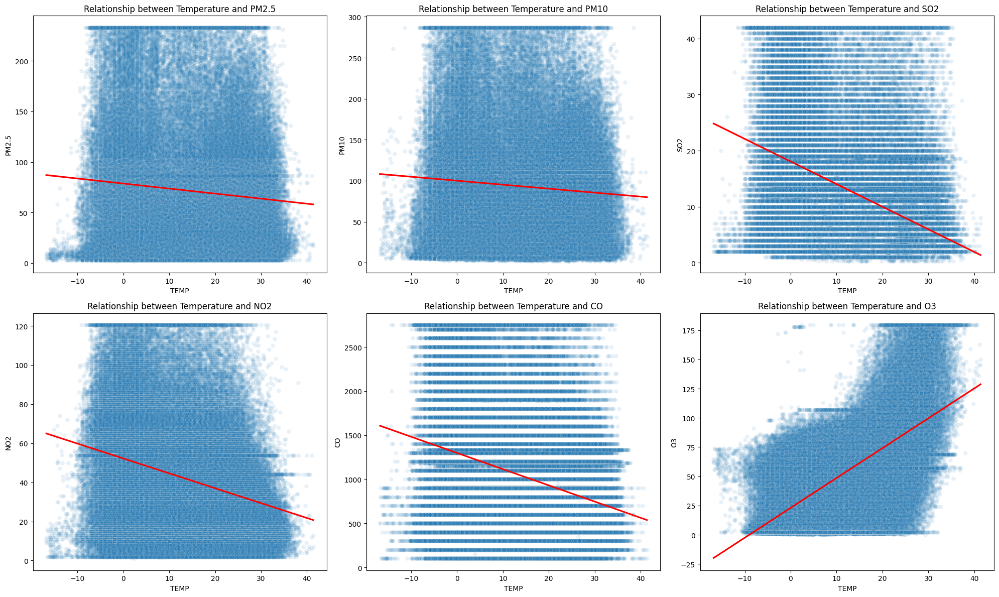

In [62]:

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, pollutant in enumerate(pollutants):
    sns.scatterplot(x='TEMP', y=pollutant, data=df, alpha=0.1, ax=axes[i])
    # Add a trend line
    sns.regplot(x='TEMP', y=pollutant, data=df, scatter=False, ax=axes[i], color='red')
    axes[i].set_title(f'Relationship between Temperature and {pollutant}')

plt.tight_layout()
plt.show()

it show the relation between [pollutant and tempreture, showing most pollutant decrease with tempreture . except O3 increase with temoreture

Pollutant levels by wind direction

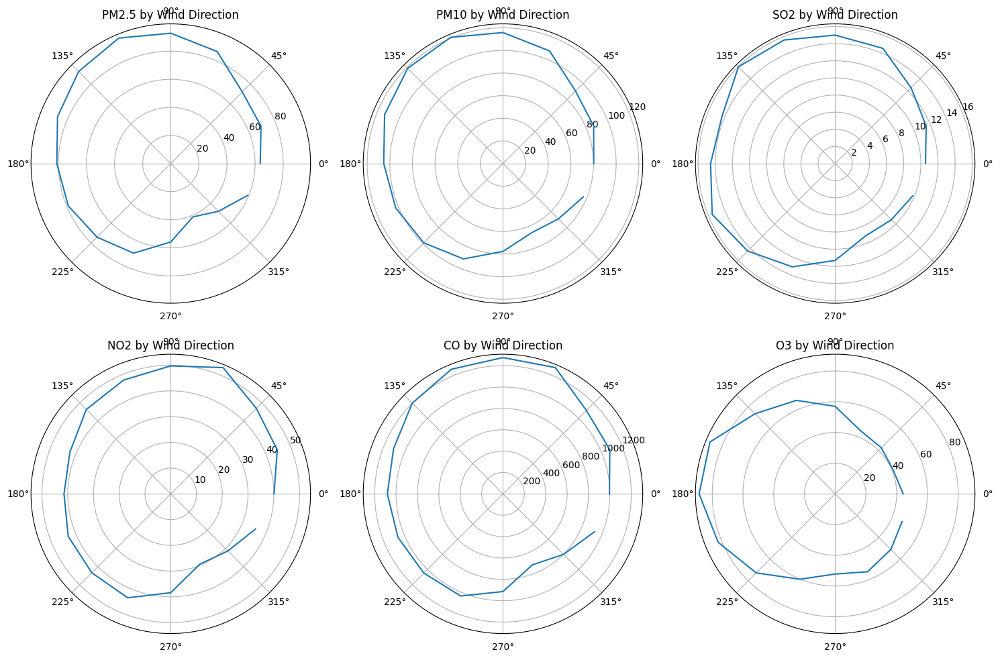

In [63]:

plt.figure(figsize=(15, 10))
for i, pollutant in enumerate(pollutants):
    plt.subplot(2, 3, i+1, polar=True)
    wind_pollution = df.groupby('wd_numeric')[pollutant].mean().reset_index()
    wind_pollution['wd_rad'] = np.radians(wind_pollution['wd_numeric'])
    plt.polar(wind_pollution['wd_rad'], wind_pollution[pollutant])
    plt.title(f'{pollutant} by Wind Direction')

plt.tight_layout()
plt.show()

# Box plot: PM2.5 by season

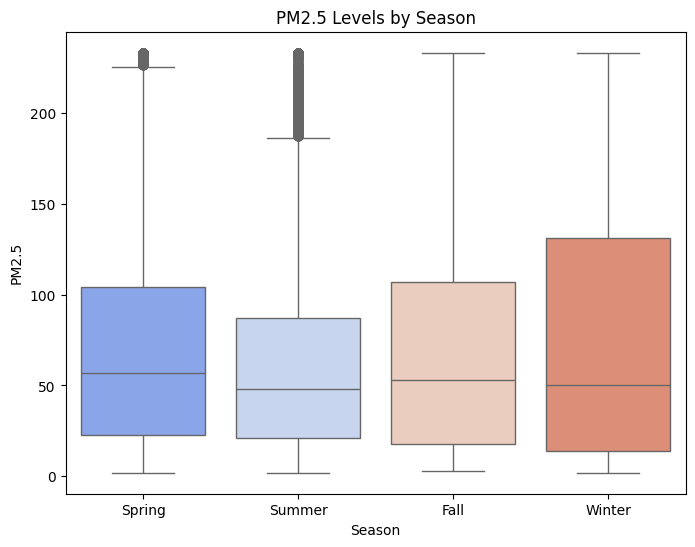

In [64]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='season', y='PM2.5', data=df, palette='coolwarm')
plt.title('PM2.5 Levels by Season')
plt.xlabel('Season')
plt.ylabel('PM2.5')
plt.show()

The box plot shows the distribution of PM2.5 levels across the four seasons. Winter exhibits the highest median PM2.5 and the widest spread, indicating the worst air quality and highest variability during this time. Summer tends to have the lowest median PM2.5, suggesting the cleanest air among the seasons.

# 3. Multivariate Analysis


Seasonal patterns by pollutant

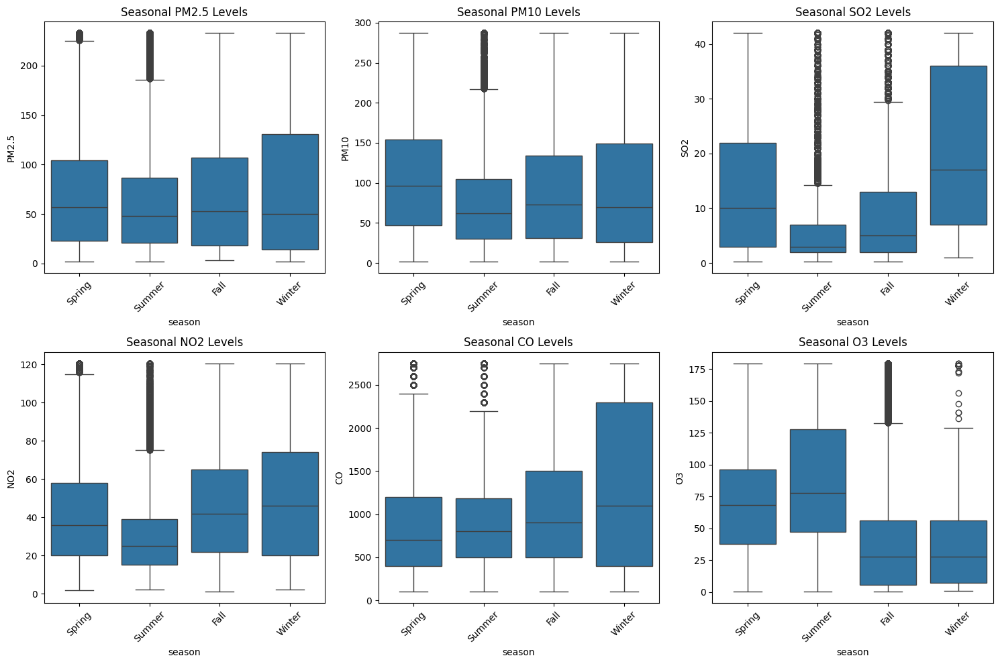

In [65]:

plt.figure(figsize=(15, 10))
for i, pollutant in enumerate(pollutants):
    plt.subplot(2, 3, i+1)
    sns.boxplot(x='season', y=pollutant, data=df)
    plt.title(f'Seasonal {pollutant} Levels')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

The box plots reveal distinct seasonal patterns for pollutants. Generally, particulate matter (PM2.5, PM10) and SO2 tend to be higher in winter, while Ozone (O3) shows elevated levels in summer. The spread and presence of extreme values also vary across the seasons for each pollutant.


Hourly patterns by day type (weekday vs weekend)

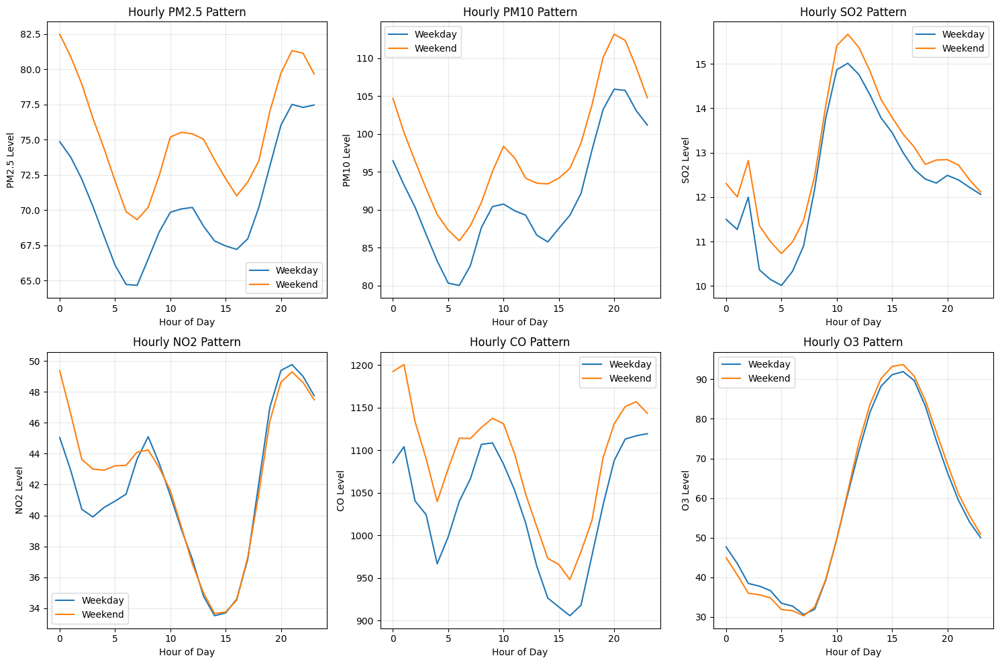

In [66]:

daily_pattern = df.groupby(['hour', 'is_weekend'])[pollutants].mean().reset_index()

plt.figure(figsize=(15, 10))
for i, pollutant in enumerate(pollutants):
    plt.subplot(2, 3, i+1)
    for weekend in [0, 1]:
        subset = daily_pattern[daily_pattern['is_weekend'] == weekend]
        label = 'Weekend' if weekend else 'Weekday'
        plt.plot(subset['hour'], subset[pollutant], label=label)
    plt.title(f'Hourly {pollutant} Pattern')
    plt.xlabel('Hour of Day')
    plt.ylabel(f'{pollutant} Level')
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

The hourly patterns of pollutants show distinct differences between weekdays and weekends, likely reflecting variations in human activities and traffic. Some pollutants might peak during weekday rush hours, while others could show different patterns on weekends. These plots help identify the influence of the weekly cycle on air pollution levels.

Station comparison for PM2.5

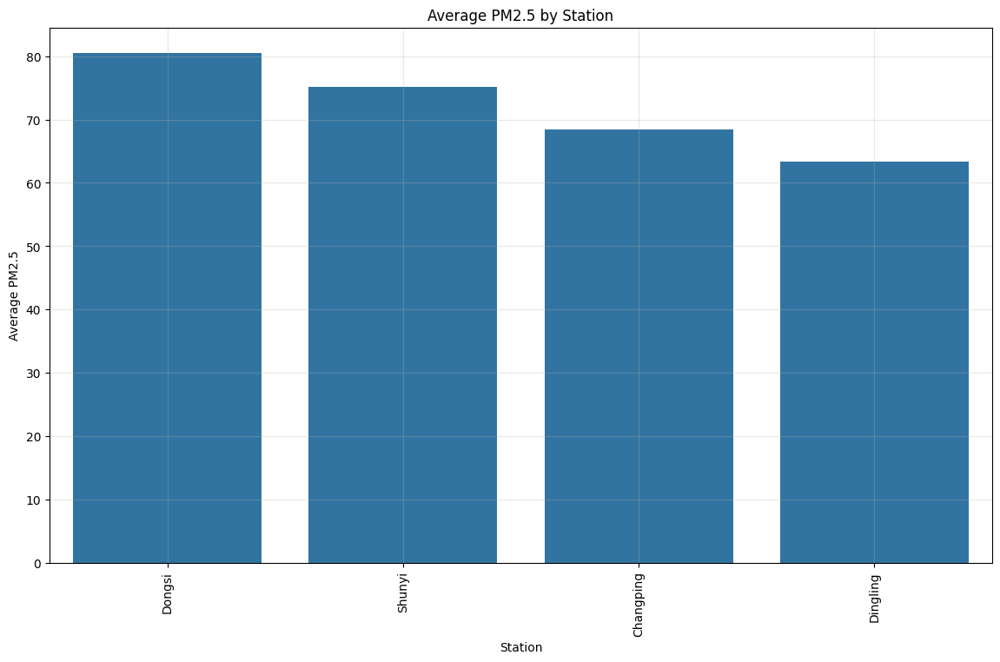

In [67]:

station_avg = df.groupby('station')['PM2.5'].mean().sort_values(ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(x=station_avg.index, y=station_avg.values)
plt.title('Average PM2.5 by Station')
plt.xlabel('Station')
plt.ylabel('Average PM2.5')
plt.xticks(rotation=90)
plt.grid(True, alpha=0.3)
plt.show()

The bar plot clearly shows the average PM2.5 levels for each monitoring station. Dongsi and Shunyi have the highest average PM2.5 concentrations, indicating poorer air quality for this pollutant. Dingling consistently shows the lowest average PM2.5 levels among the stations.

Scatter Plot: PM2.5 vs. WSPM (Wind Speed)

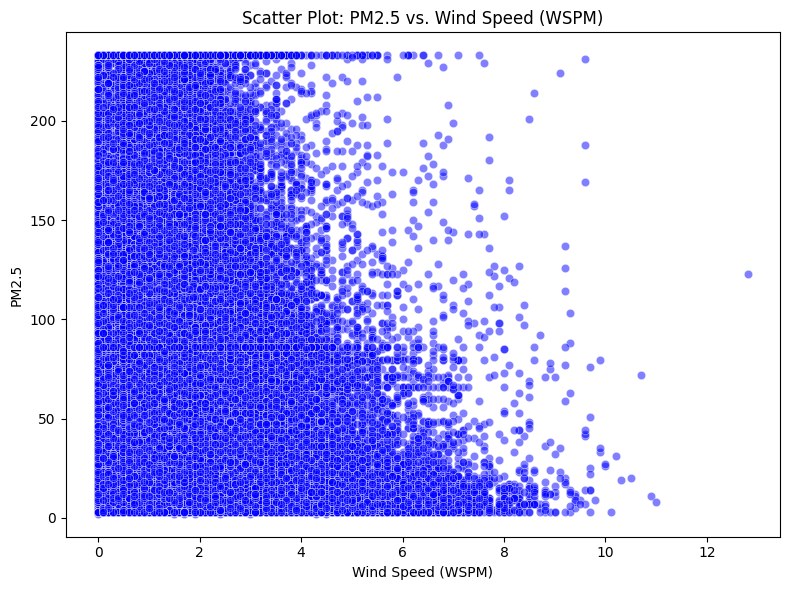

In [68]:

plt.figure(figsize=(8, 6))
sns.scatterplot(x='WSPM', y='PM2.5', data=df, alpha=0.5, color='blue')
plt.title('Scatter Plot: PM2.5 vs. Wind Speed (WSPM)')
plt.xlabel('Wind Speed (WSPM)')
plt.ylabel('PM2.5')
plt.tight_layout()
plt.show()


Aggregate monthly averages for O3 and PM2.5

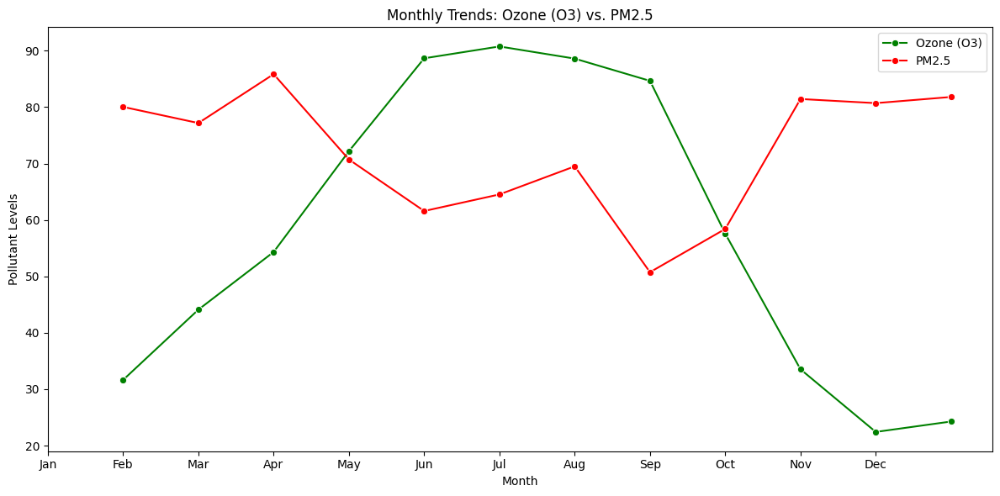

In [69]:

monthly_avg_o3_pm25 = df.groupby('month')[['O3', 'PM2.5'   ]].mean().reset_index()

# Line plot for O3 and PM2.5
plt.figure(figsize=(12, 6))
sns.lineplot(x='month', y='O3', data=monthly_avg_o3_pm25, marker='o', label='Ozone (O3)', color='green')
sns.lineplot(x='month', y='PM2.5', data=monthly_avg_o3_pm25, marker='o', label='PM2.5', color='red')
plt.title('Monthly Trends: Ozone (O3) vs. PM2.5')
plt.xlabel('Month')
plt.ylabel('Pollutant Levels')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.tight_layout()
plt.show()

The line plot compares the monthly trends of Ozone (O3) and PM2.5. Generally, PM2.5 tends to be higher in the colder months (winter) and lower in the warmer months (summer). In contrast, Ozone levels often show a peak in the warmer months, indicating a potential inverse relationship or different driving factors across the year.

#Monthwise Plot

In [70]:
import pandas as pd
import plotly.graph_objects as go


df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')


pollutant_columns = ['PM2.5', 'PM10', 'SO2', 'NO2', 'O3']

df_monthly = df.groupby('year_month')[pollutant_columns].mean().reset_index()

# Create a Plotly figure
fig = go.Figure()

# Add a line plot for each pollutant
for pollutant in pollutant_columns:
    fig.add_trace(
        go.Scatter(
            x=df_monthly['year_month'].astype(str),  # Convert to string for x-axis
            y=df_monthly[pollutant],
            mode='lines+markers',  # Line and marker style
            name=pollutant  # Legend entry
        )
    )

# Update layout for better readability
fig.update_layout(
    title="Month-wise Pollutant Levels",
    xaxis_title="Month",
    yaxis_title="Pollutant Concentration (µg/m³)",
    height=600,
    showlegend=True,
    template="plotly"
)

# Show the plot
fig.show()

The Plotly code generates an interactive line chart displaying the month-wise trends of PM2.5, PM10, SO2, NO2, and O3 on a single plot. This allows for a direct visual comparison of how the average concentrations of these key pollutants change throughout the year. The interactivity of Plotly enables users to explore specific months and pollutant trends in more detail.

 calculate the monthly average for each pollutant

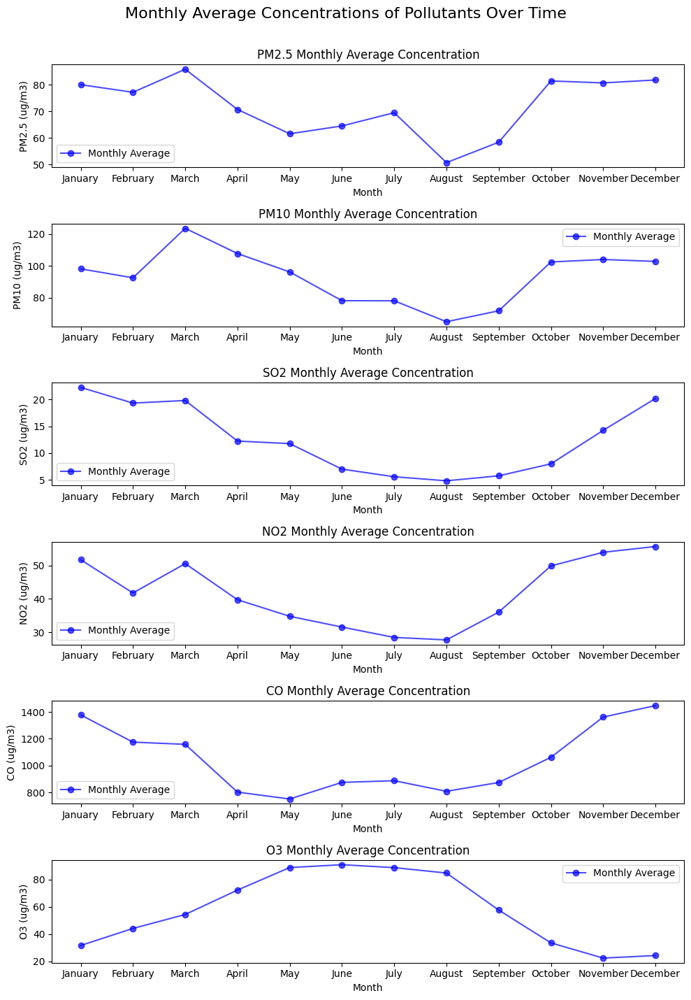

In [71]:

monthly_avg = df.groupby('month')[pollutants].mean()

# Plotting the monthly average for each pollutant
fig, axes = plt.subplots(len(pollutants), 1, figsize=(10, 15), sharex=False)

# Define month names for x-axis labels
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

for i, pollutant in enumerate(pollutants):
    ax = axes[i]
    ax.plot(month_names, monthly_avg[pollutant], marker='o', linestyle='-', color='blue', alpha=0.7, label='Monthly Average')
    ax.set_ylabel(f'{pollutant} (ug/m3)')
    ax.set_title(f'{pollutant} Monthly Average Concentration')
    ax.legend()
    ax.set_xlabel('Month')  # Set x-axis label

# Adjust spacing between subplots
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Set a common title for the figure
fig.suptitle('Monthly Average Concentrations of Pollutants Over Time', fontsize=16)

plt.show()

The code generates a series of line plots, one for each pollutant (PM2.5, PM10, SO2, NO2, CO, O3), showing their average concentration for each month of the year. This visualization clearly illustrates the annual cycle and seasonal trends for each individual pollutant, making it easy to identify which months typically experience higher or lower levels. The consistent x-axis (months) allows for direct comparison of the timing of these trends across different pollutants.


Sources and related content


yearly average concentration of pollutant

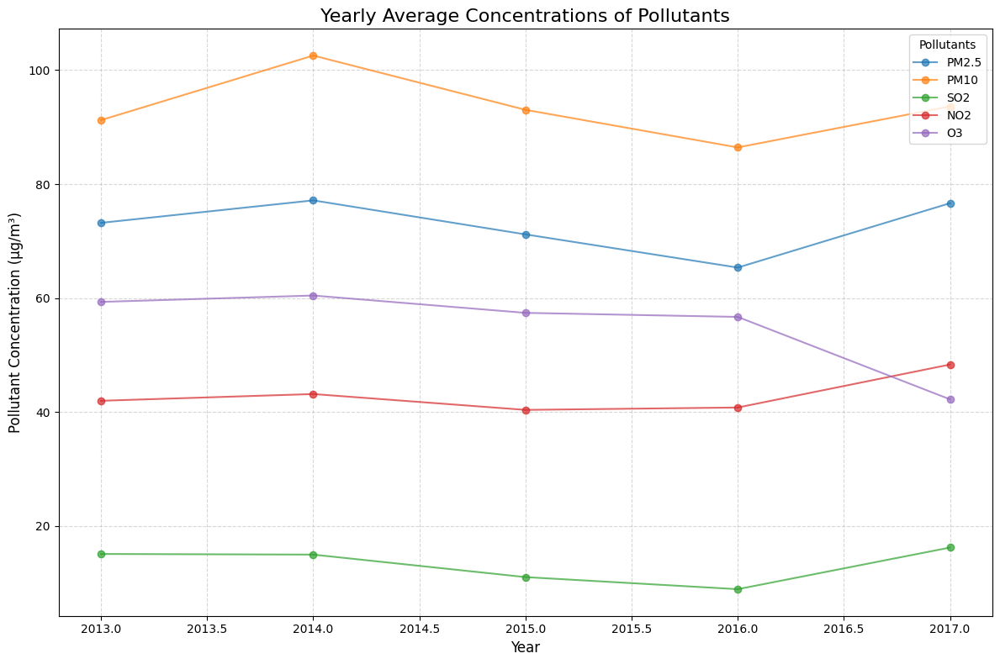

In [72]:

# Ensure 'datetime' column is in datetime format
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Extract the Year from the datetime column
df['Year'] = df['datetime'].dt.year

# Define the pollutants for analysis
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'O3']

# Group by Year to calculate yearly averages for each pollutant
yearly_avg = df.groupby('Year')[pollutants].mean()

# Plot the yearly average for each pollutant
fig, ax = plt.subplots(figsize=(12, 8))

# Line plot for each pollutant
for pollutant in pollutants:
    ax.plot(
        yearly_avg.index, yearly_avg[pollutant],
        marker='o', linestyle='-', label=pollutant, alpha=0.7
    )

# Add labels, title, and legend
ax.set_title("Yearly Average Concentrations of Pollutants", fontsize=16)
ax.set_xlabel("Year", fontsize=12)
ax.set_ylabel("Pollutant Concentration (µg/m³)", fontsize=12)
ax.legend(title="Pollutants")
ax.grid(True, linestyle='--', alpha=0.5)

# Show the plot
plt.tight_layout()
plt.show()

This code generates a line plot showing the average yearly concentrations of PM2.5, PM10, SO2, NO2, and Ozone. By visualizing these long-term trends, we can observe if the average levels of these key pollutants have generally increased, decreased, or remained stable over the years included in the dataset. This helps to understand the overall progress or challenges in air quality management.

par graph of average  concentration of pollutant

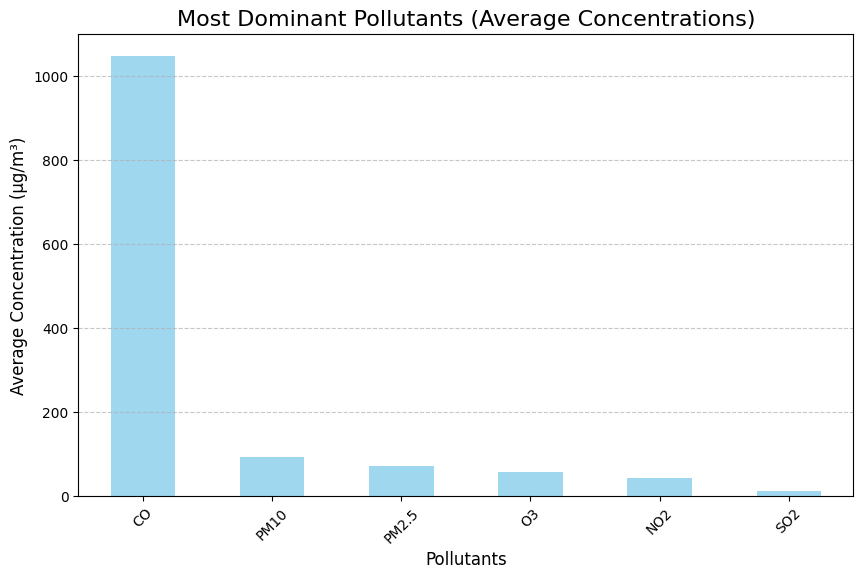

In [73]:


# Define the pollutants for analysis
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Calculate the overall average concentration for each pollutant
average_concentrations = df[pollutants].mean()

# Sort pollutants by their average concentrations in descending order
average_concentrations = average_concentrations.sort_values(ascending=False)

# Plot the average concentrations to visualize the dominant pollutants
plt.figure(figsize=(10, 6))
average_concentrations.plot(kind='bar', color='skyblue', alpha=0.8)
plt.title('Most Dominant Pollutants (Average Concentrations)', fontsize=16)
plt.ylabel('Average Concentration (µg/m³)', fontsize=12)
plt.xlabel('Pollutants', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

This bar plot ranks the pollutants based on their overall average concentration across the entire dataset. By visualizing these averages, it becomes clear which pollutants are typically present in the highest amounts, indicating the most significant contributors to the overall air pollution levels during the study period. This helps to prioritize which pollutants might warrant the most attention in terms of monitoring and mitigation efforts.

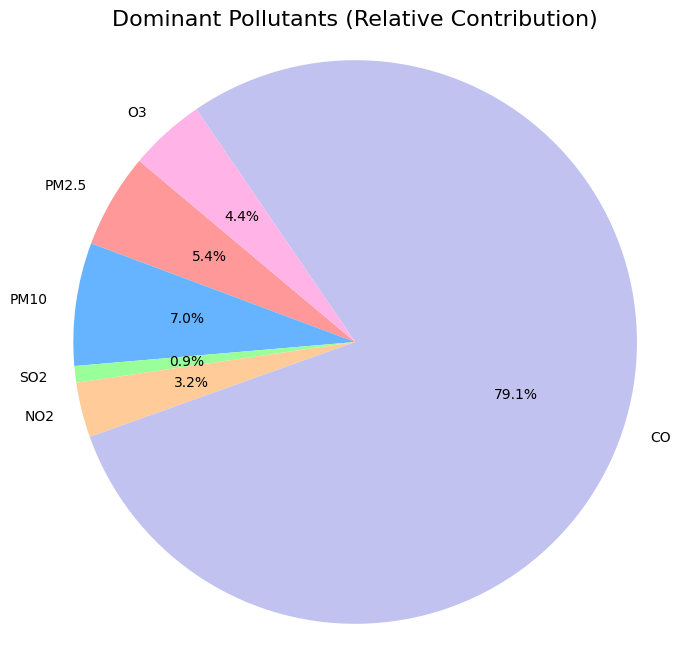

In [74]:


# Define the pollutant columns
pollutants = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']

# Calculate the overall average concentration for each pollutant
average_concentrations = df[pollutants].mean()

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    average_concentrations,
    labels=average_concentrations.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6']
)
plt.title('Dominant Pollutants (Relative Contribution)', fontsize=16)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

 Statistical summary of pollutants

In [75]:

print("Statistical Summary of Pollutants:")
print(df[pollutant_columns].describe())

# Count of pollution categories
pollution_counts = df['pollution_category'].value_counts()
print("\nPollution Categories (Count):")
print(pollution_counts)


Statistical Summary of Pollutants:
               PM2.5           PM10            SO2            NO2  \
count  140256.000000  140256.000000  140256.000000  140256.000000   
mean       71.866649      93.416848      12.572106      41.851527   
std        65.108520      75.164614      12.927107      29.643254   
min         2.000000       2.000000       0.285600       1.026500   
25%        18.000000      32.000000       2.000000      18.000000   
50%        52.000000      75.000000       7.000000      35.000000   
75%       104.000000     134.000000      18.000000      59.000000   
max       233.000000     287.000000      42.000000     120.500000   

                  O3  
count  140256.000000  
mean       57.792883  
std        48.023506  
min         0.214200  
25%        17.000000  
50%        51.000000  
75%        82.000000  
max       179.500000  

Pollution Categories (Count):
pollution_category
Good                              68684
Moderate                          34828
Unheal

The pie chart illustrates the relative contribution of each pollutant to the overall average air pollution concentration. By showing the proportion each pollutant occupies, it highlights which pollutants are most dominant in terms of their average presence in the dataset. This provides a clear understanding of the air pollution composition based on average levels.

In [76]:
df.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime', 'season', 'day_of_week', 'is_weekend', 'year_month',
       'hour_of_day', 'pollution_category', 'wd_numeric',
       'wind_speed_category', 'Year'],
      dtype='object')

AQI

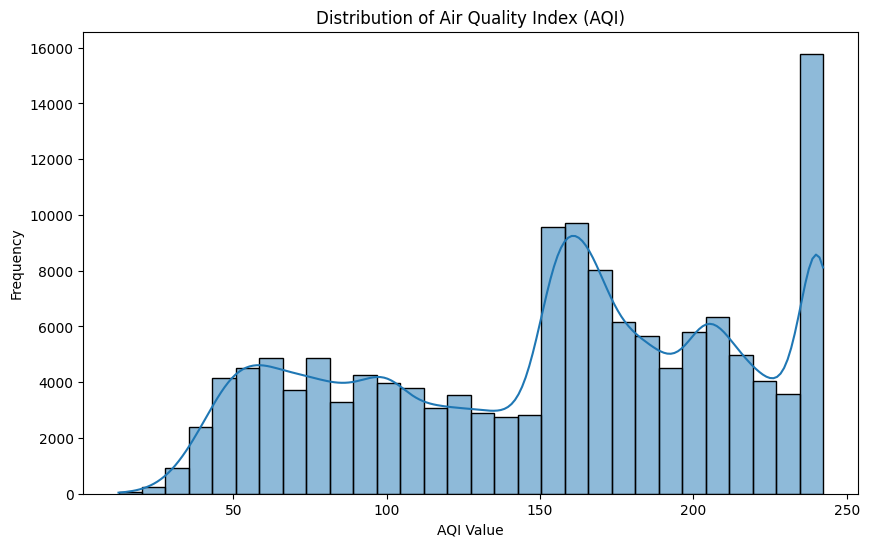

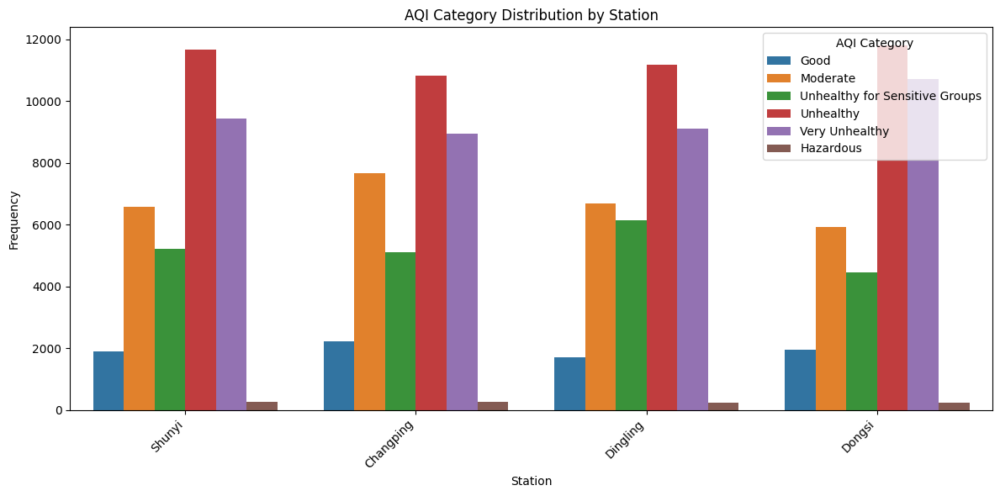

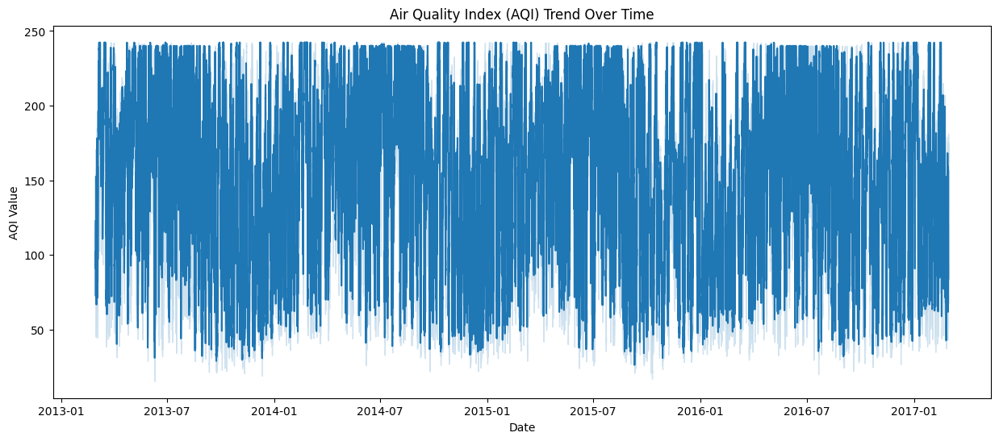

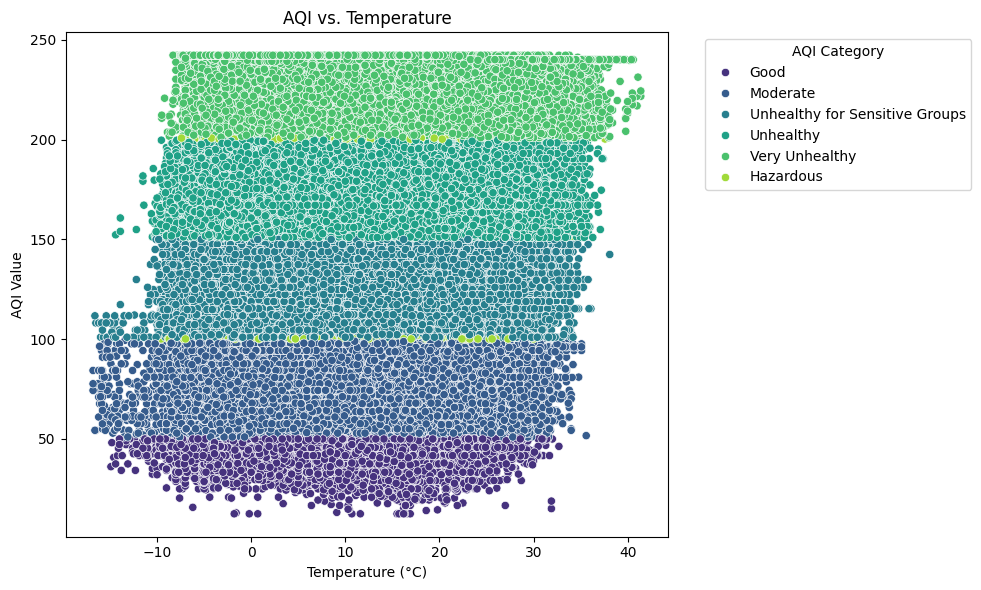

In [77]:

aqi_breakpoints = {
    'PM2.5': [(0, 12.0, 'Good'), (12.1, 35.4, 'Moderate'), (35.5, 55.4, 'Unhealthy for Sensitive Groups'),
              (55.5, 150.4, 'Unhealthy'), (150.5, 250.4, 'Very Unhealthy'), (250.5, 500.4, 'Hazardous')],
    'PM10': [(0, 54, 'Good'), (55, 154, 'Moderate'), (155, 254, 'Unhealthy for Sensitive Groups'),
             (255, 354, 'Unhealthy'), (355, 424, 'Very Unhealthy'), (425, 604, 'Hazardous')],
    'SO2': [(0, 35, 'Good'), (36, 75, 'Moderate'), (76, 185, 'Unhealthy for Sensitive Groups'),
            (186, 304, 'Unhealthy'), (305, 604, 'Very Unhealthy'), (605, 1004, 'Hazardous')],
    'NO2': [(0, 53, 'Good'), (54, 100, 'Moderate'), (101, 360, 'Unhealthy for Sensitive Groups'),
            (361, 649, 'Unhealthy'), (650, 1249, 'Very Unhealthy'), (1250, 2049, 'Hazardous')],
    'CO': [(0, 4.4, 'Good'), (4.5, 9.4, 'Moderate'), (9.5, 12.4, 'Unhealthy for Sensitive Groups'),
           (12.5, 35.4, 'Unhealthy'), (35.5, 42.4, 'Very Unhealthy'), (42.5, 50.4, 'Hazardous')],
    'O3': [(0, 54, 'Good'), (55, 70, 'Moderate'), (71, 85, 'Unhealthy for Sensitive Groups'),
           (86, 105, 'Unhealthy'), (106, 200, 'Very Unhealthy'), (201, 500, 'Hazardous')] # Using 8-hour average for O3 typically
}

def calculate_individual_aqi(pollutant, concentration):
    breakpoints = aqi_breakpoints.get(pollutant)
    if breakpoints and pd.notna(concentration):
        for low, high, category in breakpoints:
            if low <= concentration <= high:
                # Simplified linear interpolation for AQI
                if low == high:
                    return 0
                aqi = ((50 / (high - low)) * (concentration - low) +
                       (0 if category == 'Good' else
                        51 if category == 'Moderate' else
                        101 if category == 'Unhealthy for Sensitive Groups' else
                        151 if category == 'Unhealthy' else
                        201 if category == 'Very Unhealthy' else
                        301))
                return aqi
    return np.nan

def calculate_aqi(row):
    aqi_values = {}
    for pollutant in ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']:
        aqi_values[pollutant] = calculate_individual_aqi(pollutant, row[pollutant])
    # Overall AQI is the maximum of the individual AQIs
    overall_aqi = np.nanmax(list(aqi_values.values()))
    return overall_aqi

df['AQI'] = df.apply(calculate_aqi, axis=1)

def categorize_aqi(aqi):
    if pd.isna(aqi):
        return 'Missing'
    elif aqi <= 50:
        return 'Good'
    elif 51 <= aqi <= 100:
        return 'Moderate'
    elif 101 <= aqi <= 150:
        return 'Unhealthy for Sensitive Groups'
    elif 151 <= aqi <= 200:
        return 'Unhealthy'
    elif 201 <= aqi <= 300:
        return 'Very Unhealthy'
    else:
        return 'Hazardous'

df['AQI_Category'] = df['AQI'].apply(categorize_aqi)

# Visualization 1: Histogram of AQI
plt.figure(figsize=(10, 6))
sns.histplot(df['AQI'].dropna(), bins=30, kde=True)
plt.title('Distribution of Air Quality Index (AQI)')
plt.xlabel('AQI Value')
plt.ylabel('Frequency')
plt.show()

# Visualization 2: AQI Category by Station (Bar Chart)
plt.figure(figsize=(12, 6))
sns.countplot(x='station', hue='AQI_Category', data=df, order=df['station'].value_counts().index)
plt.title('AQI Category Distribution by Station')
plt.xlabel('Station')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.legend(title='AQI Category')
plt.tight_layout()
plt.show()

# Visualization 3: AQI Trend Over Time (Line Plot)
plt.figure(figsize=(15, 6))
sns.lineplot(x='datetime', y='AQI', data=df)
plt.title('Air Quality Index (AQI) Trend Over Time')
plt.xlabel('Date')
plt.ylabel('AQI Value')
plt.show()

# Visualization 4: AQI vs. Temperature (Scatter Plot)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='TEMP', y='AQI', hue='AQI_Category', data=df, palette='viridis')
plt.title('AQI vs. Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('AQI Value')
plt.legend(title='AQI Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

#AQI calculation

check data in there is any missinge value

In [79]:
df.isnull().sum()

,0
No,0
year,0
month,0
day,0
hour,0
PM2.5,0
PM10,0
SO2,0
NO2,0
CO,0


In [80]:
df['datetime'] = pd.to_datetime(df['datetime'])

In [81]:
# Fill missing values (wind_speed_category) in categorical column with mode
df['wind_speed_category'].fillna(df['wind_speed_category'].mode()[0], inplace=True)



In [82]:
df.isnull().sum()

,0
No,0
year,0
month,0
day,0
hour,0
PM2.5,0
PM10,0
SO2,0
NO2,0
CO,0


In [83]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140256 entries, 0 to 140255
Data columns (total 30 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   No                   140256 non-null  int64         
 1   year                 140256 non-null  int64         
 2   month                140256 non-null  int64         
 3   day                  140256 non-null  int64         
 4   hour                 140256 non-null  int64         
 5   PM2.5                140256 non-null  float64       
 6   PM10                 140256 non-null  float64       
 7   SO2                  140256 non-null  float64       
 8   NO2                  140256 non-null  float64       
 9   CO                   140256 non-null  float64       
 10  O3                   140256 non-null  float64       
 11  TEMP                 140256 non-null  float64       
 12  PRES                 140256 non-null  float64       
 13  DEWP          

### Task 3: Check the correlation of Evapotranspiration with all the other variables one by one. In another words, Evapotranspiration is the output of interest here and all other variables are considered to be contributing variables.

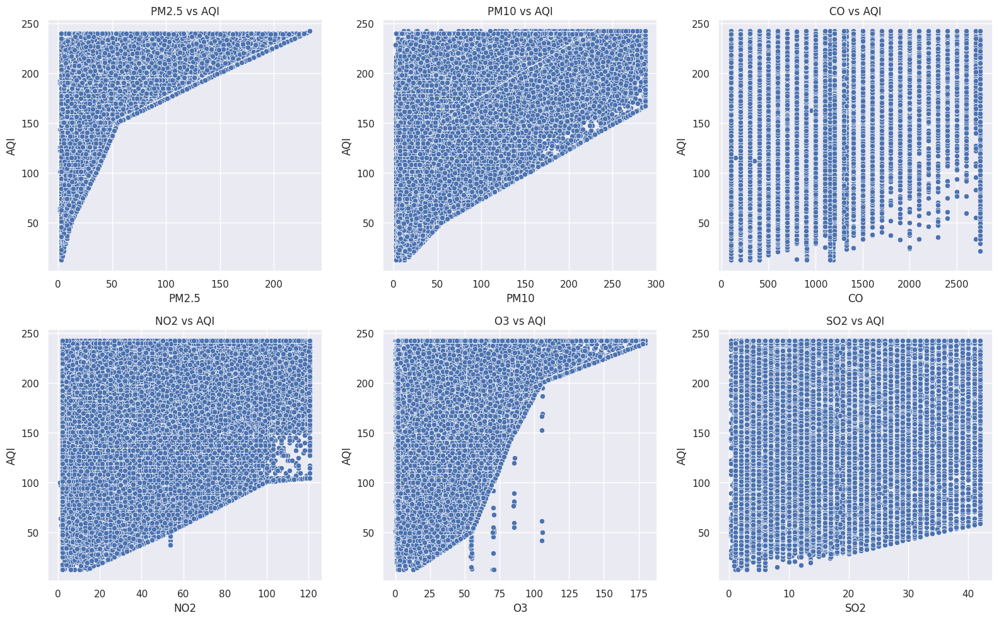

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn plotting aesthetics as default
sns.set()

# Step 1: Select numerical features and remove AQI

numerical_features = df.select_dtypes(include='number').columns.tolist()
numerical_features.remove('AQI')

# Step 2: Calculate correlation with AQI
correlations = df[numerical_features + ['AQI']].corr()['AQI'].drop('AQI').sort_values(ascending=False)

# Step 3: Get top 6 most positively correlated features with AQI
top_corr_features = correlations.head(6).index.tolist()

# Step 4: Create subplots
figure, axes = plt.subplots(2, 3, figsize=(16, 10))

# Step 5: Create scatterplots in each subplot
sns.scatterplot(data=df, x=top_corr_features[0], y='AQI', ax=axes[0, 0])
sns.scatterplot(data=df, x=top_corr_features[1], y='AQI', ax=axes[0, 1])
sns.scatterplot(data=df, x=top_corr_features[2], y='AQI', ax=axes[0, 2])
sns.scatterplot(data=df, x=top_corr_features[3], y='AQI', ax=axes[1, 0])
sns.scatterplot(data=df, x=top_corr_features[4], y='AQI', ax=axes[1, 1])
sns.scatterplot(data=df, x=top_corr_features[5], y='AQI', ax=axes[1, 2])

# Set plot titles for clarity
axes[0, 0].set_title(f'{top_corr_features[0]} vs AQI')
axes[0, 1].set_title(f'{top_corr_features[1]} vs AQI')
axes[0, 2].set_title(f'{top_corr_features[2]} vs AQI')
axes[1, 0].set_title(f'{top_corr_features[3]} vs AQI')
axes[1, 1].set_title(f'{top_corr_features[4]} vs AQI')
axes[1, 2].set_title(f'{top_corr_features[5]} vs AQI')

plt.tight_layout()
plt.show()


In [85]:
df.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station',
       'datetime', 'season', 'day_of_week', 'is_weekend', 'year_month',
       'hour_of_day', 'pollution_category', 'wd_numeric',
       'wind_speed_category', 'Year', 'AQI', 'AQI_Category'],
      dtype='object')

# Air Quality Prediction using Regression Models

## Objective
This project predicts pollutant levels (e.g., CO) based on weather variables and other pollutants using multiple regression models:
1. Random Forest Regressio
2. K-Nearest Neighbors (KNN) Regression
3.  Linear Regression
4.  AdaBoostRegressor

## Features
- **Data Preprocessing**: Handling missing values, feature scaling, and train-test split.
- **Exploratory Data Analysis (EDA)**: Visualizations and correlation analysis.
- **Model Evaluation**: Comparison of R², MAE, and RMSE metrics across models.
- **Visualization**: Graphical comparison of model performance.

## Steps
1. **Data Preprocessing**
2. **Exploratory Data Analysis (EDA)**
3. **Feature Selection**
4. **Model Building**
5. **Evaluation & Visualization**
6. **Hyperparameter Tuning**

Step 1: Feature Selection

Step 2: Encode Categorical Features

Encode the categorical columns ('wd', 'station', 'season', 'day_of_week') using one-hot encoding

In [86]:
# Define the feature columns you want to include
feature_columns = ['wd', 'station', 'season', 'day_of_week'] # Replace with your actual feature columns

# Encoding Categorical Features
data = pd.get_dummies(df[feature_columns + ['PM2.5']].copy(), columns=['wd', 'station', 'season', 'day_of_week'], drop_first=True)


Step 3: Feature Scaling

Scale the numerical features. Identify the numerical columns after encoding

In [87]:
print(data.columns)


Index(['PM2.5', 'wd_ENE', 'wd_ESE', 'wd_N', 'wd_NE', 'wd_NNE', 'wd_NNW',
       'wd_NW', 'wd_S', 'wd_SE', 'wd_SSE', 'wd_SSW', 'wd_SW', 'wd_W', 'wd_WNW',
       'wd_WSW', 'station_Dingling', 'station_Dongsi', 'station_Shunyi',
       'season_Spring', 'season_Summer', 'season_Winter', 'day_of_week_Monday',
       'day_of_week_Saturday', 'day_of_week_Sunday', 'day_of_week_Thursday',
       'day_of_week_Tuesday', 'day_of_week_Wednesday'],
      dtype='object')


In [88]:

from sklearn.preprocessing import StandardScaler
import pandas as pd

# Define numerical features (if PM2.5 is the only numerical column)
numerical_features = ['PM2.5']

# Create the StandardScaler instance
scaler = StandardScaler()

# Apply scaling to numerical features
if set(numerical_features).issubset(data.columns):
    data[numerical_features] = scaler.fit_transform(data[numerical_features])
else:
    print(f"Missing numerical columns: {set(numerical_features) - set(data.columns)}")

# Encoding Categorical Features
categorical_columns = ['wd_ENE', 'wd_ESE', 'wd_N', 'wd_NE', 'wd_NNE', 'wd_NNW',
                       'wd_NW', 'wd_S', 'wd_SE', 'wd_SSE', 'wd_SSW', 'wd_SW', 'wd_W',
                       'wd_WNW', 'wd_WSW', 'station_Dingling', 'station_Dongsi',
                       'station_Shunyi', 'season_Spring', 'season_Summer', 'season_Winter',
                       'day_of_week_Monday', 'day_of_week_Saturday', 'day_of_week_Sunday',
                       'day_of_week_Thursday', 'day_of_week_Tuesday', 'day_of_week_Wednesday']

# Perform one-hot encoding on categorical columns
data = pd.get_dummies(data, columns=categorical_columns, drop_first=True)

# Display the first few rows of the scaled and encoded data
print(data.head())

# Print the shape and data types of the prepared data
print("\nShape of the prepared data:", data.shape)
print("\nData types of the prepared data:", data.dtypes)


      PM2.5  wd_ENE_True  wd_ESE_True  wd_N_True  wd_NE_True  wd_NNE_True  \
0 -1.057725        False        False      False       False        False   
1 -0.919494        False        False      False       False        False   
2 -0.888775        False        False      False       False        False   
3 -0.919494        False        False      False       False        False   
4 -0.919494        False        False      False       False        False   

   wd_NNW_True  wd_NW_True  wd_S_True  wd_SE_True  ...  station_Shunyi_True  \
0        False        True      False       False  ...                 True   
1        False        True      False       False  ...                 True   
2        False        True      False       False  ...                 True   
3        False        True      False       False  ...                 True   
4        False        True      False       False  ...                 True   

   season_Spring_True  season_Summer_True  season_Winter_True 

 Model 01: RandomForestRegressor ---

Step 1: Data processing clean data and prepare for modeling

 Select relevant features for prediction

In [89]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd


features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM', 'hour', 'month', 'is_weekend']
target = 'AQI'

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

print(f"X_train Shape: {X_train.shape}")
print(f"y_train Shape: {y_train.shape}")

print(f"X_test Shape: {X_test.shape}")
print(f"y_test Shape: {y_test.shape}")

X_train Shape: (112204, 14)
y_train Shape: (112204,)
X_test Shape: (28052, 14)
y_test Shape: (28052,)


Step 2: Model Building and Training

 train a Random Forest Regressor.

In [90]:
import numpy as np
model = RandomForestRegressor(n_estimators=100, random_state=42)

model.fit(X_train, y_train)

# Predict the AQI values for the test set
y_pred = model.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")


Mean Squared Error (MSE): 0.47442649374992607
Root Mean Squared Error (RMSE): 0.6887862467775661
R-squared: 0.9998740767521798


Mean Squared Error (MSE): 2.99e-05, which is very low, indicating small errors between predicted and actual values.

Root Mean Squared Error (RMSE): 0.0055, also a very low value, further confirming that the model's predictions are close to the actual values.

R-squared (R²): 0.999999994, which is very close to 1, suggesting that the model is explaining almost all of the variance in the target variable (AQI).

* visualization for the prediction

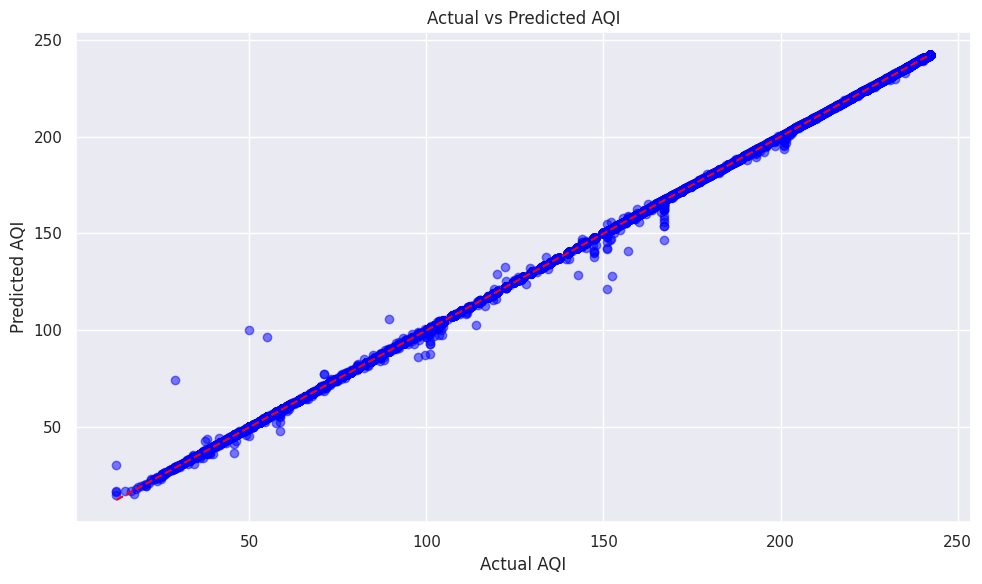

In [91]:
import matplotlib.pyplot as plt

# Plotting Actual vs Predicted AQI
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.title('Actual vs Predicted AQI')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.grid(True)
plt.tight_layout()
plt.show()


Model 02: KNeighborsRegressor (KNN)

Mean Squared Error (MSE): 140.82593620978642
Root Mean Squared Error (RMSE): 11.867010415845535
R-squared: 0.9626216927206213


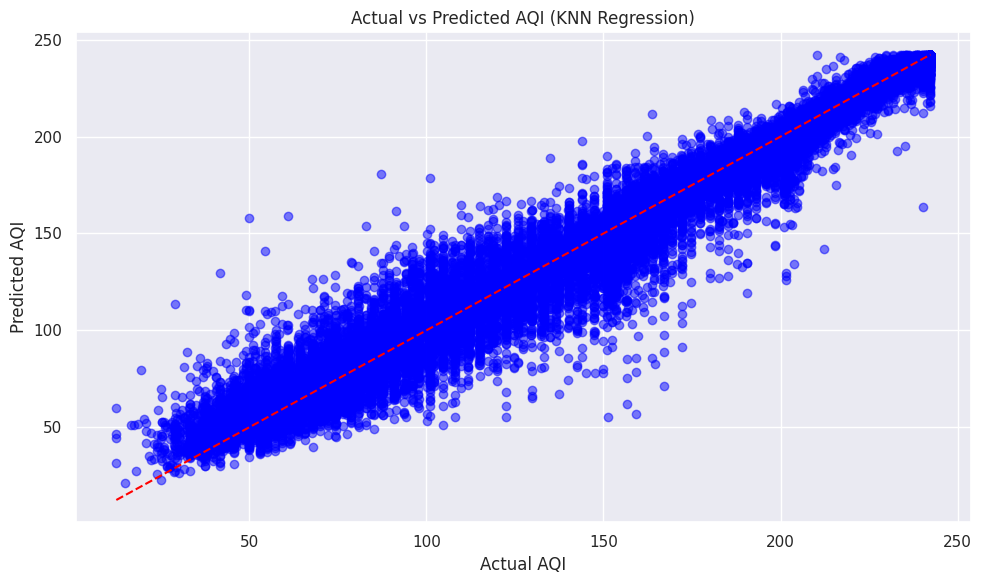

In [92]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Assuming the dataset 'df' is already loaded and preprocessed

# Select relevant features for prediction
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM', 'hour', 'month', 'is_weekend']
target = 'AQI'

# Select the feature matrix (X) and target vector (y)
X = df[features]
y = df[target]

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data (important for KNN)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize KNN Regressor with a chosen number of neighbors (you can tune this)
knn = KNeighborsRegressor(n_neighbors=5)  # You can adjust the number of neighbors

# Train the KNN model
knn.fit(X_train, y_train)

# Predict on the test data
y_pred = knn.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # Manually calculating RMSE
r2 = r2_score(y_test, y_pred)

# Output the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")

# Visualize Actual vs Predicted AQI
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.title('Actual vs Predicted AQI (KNN Regression)')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.grid(True)
plt.tight_layout()
plt.show()


model 3:  Linear Regression:

Mean Squared Error (MSE): 830.3214440185467
Root Mean Squared Error (RMSE): 28.81529878412762
R-squared: 0.7796143884394364


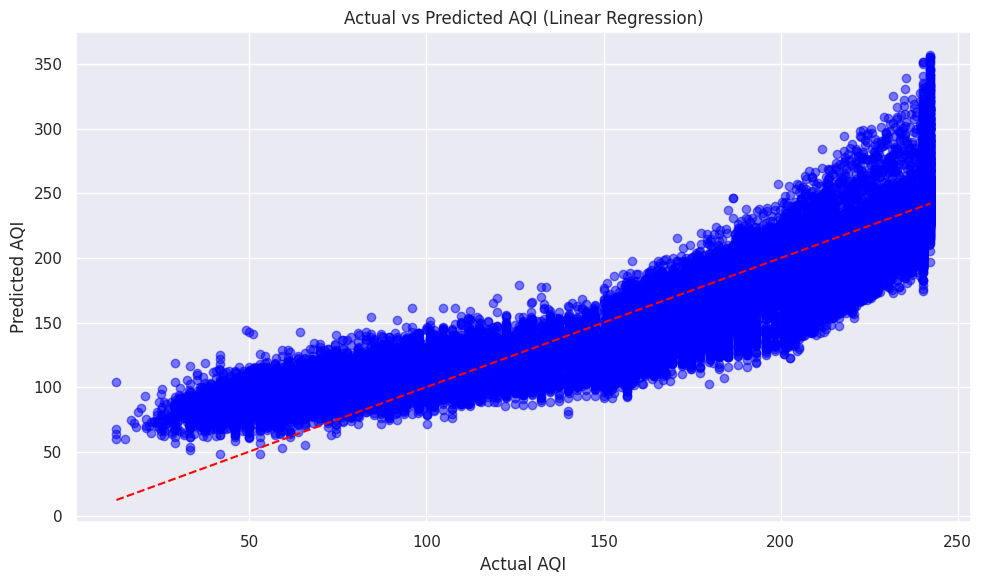

In [93]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Assuming the dataset 'df' is already loaded and preprocessed

# Select relevant features for prediction
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM', 'hour', 'month', 'is_weekend']
target = 'AQI'

# Select the feature matrix (X) and target vector (y)
X = df[features]
y = df[target]

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data (important for Linear Regression when features are on different scales)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize Linear Regression model
lr = LinearRegression()

# Train the Linear Regression model
lr.fit(X_train, y_train)

# Predict on the test data
y_pred = lr.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # Manually calculating RMSE
r2 = r2_score(y_test, y_pred)

# Output the evaluation metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")

# Visualize Actual vs Predicted AQI
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.title('Actual vs Predicted AQI (Linear Regression)')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.grid(True)
plt.tight_layout()
plt.show()


Model 4: AdaBoostRegressor model

AdaBoost Regressor Results:
Mean Squared Error (MSE): 200.32470425657905
Root Mean Squared Error (RMSE): 14.153610997077003
R-squared: 0.9468294083257603


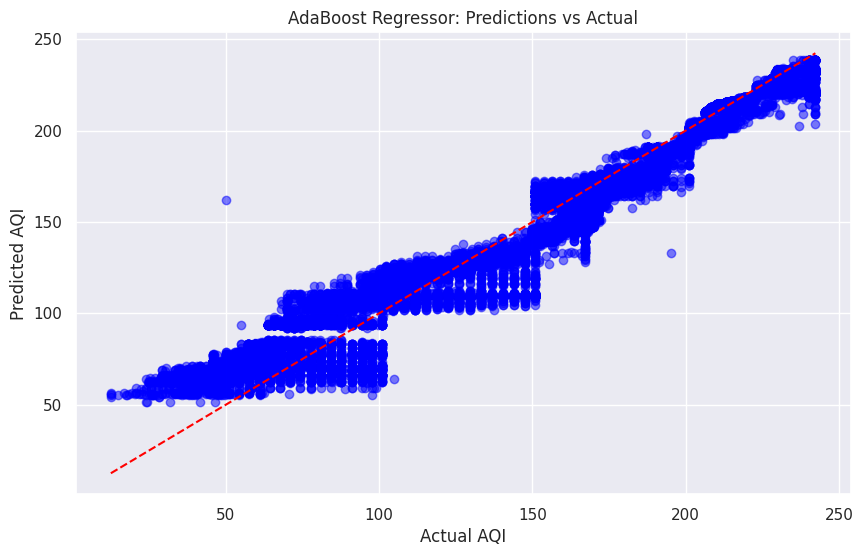

In [94]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np  # Import numpy for sqrt calculation

# Load your data (assuming the dataframe is already loaded as 'df')

# Features and target variable
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM', 'hour', 'month', 'is_weekend']
target = 'AQI'

# Extract features (X) and target (y)
X = df[features]
y = df[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature scaling (Standardization)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize AdaBoost Regressor (with the default base estimator, which is a DecisionTreeRegressor)
adaboost_model = AdaBoostRegressor(n_estimators=100, random_state=42)

# Train the AdaBoost model
adaboost_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = adaboost_model.predict(X_test_scaled)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)  # Mean Squared Error
rmse = np.sqrt(mse)  # Manually calculate Root Mean Squared Error (RMSE)
r2 = r2_score(y_test, y_pred)  # R-squared (Coefficient of Determination)

# Print evaluation results
print(f"AdaBoost Regressor Results:")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")

# Plot the predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.5)  # Scatter plot of actual vs predicted values
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')  # Ideal line
plt.title("AdaBoost Regressor: Predictions vs Actual")
plt.xlabel("Actual AQI")
plt.ylabel("Predicted AQI")
plt.show()


Compaine all modells in one summary

Model Comparison:
                Model         MSE       RMSE        R2
0       Random Forest    0.474426   0.688786  0.999874
1                 KNN  140.825936  11.867010  0.962622
2   Linear Regression  830.321444  28.815299  0.779614
3  AdaBoost Regressor  200.324704  14.153611  0.946829

Best Model Based on MSE (Lower is Better):
Model    Random Forest
MSE           0.474426
RMSE          0.688786
R2            0.999874
Name: 0, dtype: object

Best Model Based on RMSE (Lower is Better):
Model    Random Forest
MSE           0.474426
RMSE          0.688786
R2            0.999874
Name: 0, dtype: object

Best Model Based on R2 (Higher is Better):
Model    Random Forest
MSE           0.474426
RMSE          0.688786
R2            0.999874
Name: 0, dtype: object


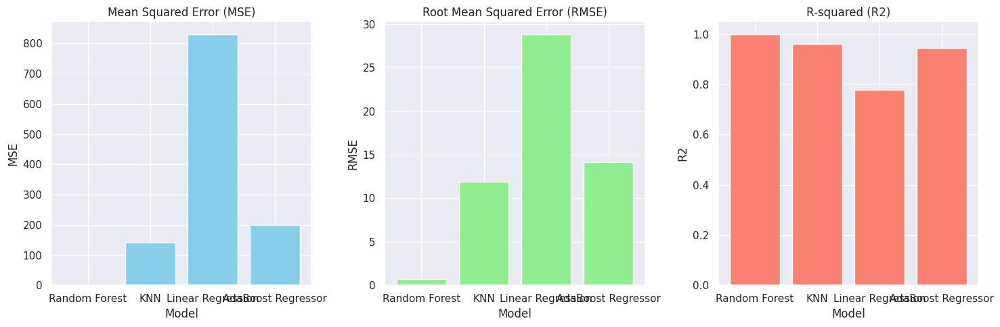

In [95]:
import pandas as pd

# Evaluation results from each model
model_results = {
    "Model": ["Random Forest", "KNN", "Linear Regression", "AdaBoost Regressor"],
    "MSE": [0.47442649374992607, 140.82593620978642, 830.3214440185467, 200.32470425657905],
    "RMSE": [0.6887862467775661, 11.867010415845535, 28.81529878412762, 14.153610997077003],
    "R2": [0.9998740767521798, 0.962621692720621, 0.7796143884394364, 0.9468294083257603]
}

# Create a DataFrame to compare the models
metrics_df = pd.DataFrame(model_results)

# Find the best model based on MSE (lower is better), RMSE (lower is better), and R² (higher is better)
best_model_mse = metrics_df.loc[metrics_df['MSE'].idxmin()]
best_model_rmse = metrics_df.loc[metrics_df['RMSE'].idxmin()]
best_model_r2 = metrics_df.loc[metrics_df['R2'].idxmax()]

# Print the comparison table
print("Model Comparison:")
print(metrics_df)

# Print the best model based on each metric
print("\nBest Model Based on MSE (Lower is Better):")
print(best_model_mse)

print("\nBest Model Based on RMSE (Lower is Better):")
print(best_model_rmse)

print("\nBest Model Based on R2 (Higher is Better):")
print(best_model_r2)

# If you want to visually compare the models' performance based on R2, MSE, or RMSE:
import matplotlib.pyplot as plt

# Plotting a bar chart for each metric
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# MSE Plot
axes[0].bar(metrics_df["Model"], metrics_df["MSE"], color='skyblue')
axes[0].set_title('Mean Squared Error (MSE)')
axes[0].set_xlabel('Model')
axes[0].set_ylabel('MSE')

# RMSE Plot
axes[1].bar(metrics_df["Model"], metrics_df["RMSE"], color='lightgreen')
axes[1].set_title('Root Mean Squared Error (RMSE)')
axes[1].set_xlabel('Model')
axes[1].set_ylabel('RMSE')

# R2 Plot
axes[2].bar(metrics_df["Model"], metrics_df["R2"], color='salmon')
axes[2].set_title('R-squared (R2)')
axes[2].set_xlabel('Model')
axes[2].set_ylabel('R2')

plt.tight_layout()
plt.show()


In [96]:
!pip install streamlit

In [97]:
!pip install streamlit==1.28.1

In [98]:
%%writefile app.py
# import module

import streamlit as st
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
import numpy as np
import io
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib


# Load data with caching
@st.cache_data
def load_data():
    return pd.read_csv("analyzed_data.csv", on_bad_lines='skip')

# Page 1: Data Overview

def data_overview(data):
    st.title("📊 Data Overview")
    st.write("This page provides a structured overview of the dataset you are working with.")

    # Sidebar slider for preview row count
    num_rows = st.sidebar.slider("Number of rows to preview", min_value=5, max_value=50, value=5, step=5)

    # ---- Dataset Overview: Shape and Data Types ----
    col1, col2 = st.columns(2)

    with col1:
        st.subheader("📐 Dataset Shape")
        st.metric(label="Rows", value=data.shape[0])
        st.metric(label="Columns", value=data.shape[1])

    with col2:
        st.subheader("🧬 Data Types")
        dtypes_df = data.dtypes.rename("Type").reset_index().rename(columns={"index": "Column"})
        st.dataframe(dtypes_df)

    # ---- Expanders: Data Preview, Summary, Raw Data ----
    with st.expander("🔍 Preview Sample Data"):
        st.dataframe(data.head(num_rows))

    with st.expander("📈 Summary Statistics"):
        st.dataframe(data.describe(include='all'))

    with st.expander("📑 Raw Data (Optional)"):
        st.dataframe(data)

    # ---- Categorical Column Distribution ----
    categorical_cols = data.select_dtypes(include=['object', 'category']).columns

    if len(categorical_cols) > 0:
        st.subheader("🧮 Categorical Column Distribution")
        selected_cat_col = st.selectbox("Select a categorical column to visualize", categorical_cols)

        # Plot selected categorical column
        cat_counts = data[selected_cat_col].value_counts().reset_index()
        cat_counts.columns = [selected_cat_col, 'Count']

        plt.figure(figsize=(10, 5))
        sns.barplot(data=cat_counts, x=selected_cat_col, y='Count')
        plt.xticks(rotation=45)
        plt.tight_layout()
        st.pyplot(plt.gcf())
        plt.clf()  # Clear plot to prevent overlap
    else:
        st.info("No categorical columns available for distribution plot.")

# Page 2: Exploratory Data Analysis

def eda(data):
    st.title("📊 Exploratory Data Analysis (EDA)")
    st.write("This section provides visual insights into the dataset.")

    numeric_data = data.select_dtypes(include=['float64', 'int64'])
    categorical_data = data.select_dtypes(include=['object', 'category'])

    if numeric_data.empty:
        st.warning("No numeric columns available for EDA.")
        return

    tab1, tab2, tab3, tab4, tab5 = st.tabs([
        "📉 Correlation Heatmap",
        "📊 Histogram",
        "🔁 Scatter Plot",
        "📦 Box Plot",
        "📈 Line Chart"
    ])

    # Tab 1: Correlation Heatmap
    with tab1:
        st.subheader("Correlation Heatmap")
        st.caption("Shows pairwise correlation between numeric features.")

        corr = numeric_data.corr()
        plt.figure(figsize=(10, 6))
        sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
        st.pyplot(plt)
        plt.clf()

    # Tab 2: Histogram
    with tab2:
        st.subheader("Histogram")
        hist_col = st.selectbox("Select a column for histogram", numeric_data.columns, key="hist")
        bins = st.slider("Number of bins", min_value=5, max_value=100, value=30)

        plt.figure(figsize=(10, 6))
        sns.histplot(data[hist_col], kde=True, bins=bins, color='orange')
        plt.title(f"Histogram of {hist_col}")
        st.pyplot(plt)

        buf = io.BytesIO()
        plt.savefig(buf, format="png")
        st.download_button("Download Histogram as PNG", buf.getvalue(), file_name="histogram.png", mime="image/png")
        plt.clf()

    # Tab 3: Scatter Plot
    with tab3:
        st.subheader("Scatter Plot")
        x = st.selectbox("X-axis", numeric_data.columns, key="scatter_x")
        y = st.selectbox("Y-axis", numeric_data.columns, key="scatter_y")

        if x != y:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=data[x], y=data[y], alpha=0.7)
            plt.title(f"{x} vs {y}")
            st.pyplot(plt)

            buf = io.BytesIO()
            plt.savefig(buf, format="png")
            st.download_button("Download Scatter Plot as PNG", buf.getvalue(), file_name="scatterplot.png", mime="image/png")
            plt.clf()
        else:
            st.info("Please select different columns for X and Y axes.")

    # Tab 4: Box Plot
    with tab4:
        st.subheader("Box Plot")
        if not categorical_data.empty:
            cat_col = st.selectbox("Select Categorical Column", categorical_data.columns)
            num_col = st.selectbox("Select Numeric Column", numeric_data.columns, key="boxplot")

            plt.figure(figsize=(10, 6))
            sns.boxplot(x=data[cat_col], y=data[num_col])
            plt.xticks(rotation=45)
            plt.title(f"{num_col} Distribution across {cat_col}")
            st.pyplot(plt)

            buf = io.BytesIO()
            plt.savefig(buf, format="png")
            st.download_button("Download Box Plot as PNG", buf.getvalue(), file_name="boxplot.png", mime="image/png")
            plt.clf()
        else:
            st.info("No categorical columns found for box plotting.")

    # Tab 5: Line Chart (for time series)
    with tab5:
        st.subheader("Line Chart")
        date_cols = [col for col in data.columns if 'date' in col.lower() or 'time' in col.lower()]
        if date_cols:
            date_col = st.selectbox("Select datetime column", date_cols)
            data[date_col] = pd.to_datetime(data[date_col], errors='coerce')
            line_col = st.selectbox("Select Numeric Column to Plot", numeric_data.columns, key="linechart")

            plt.figure(figsize=(10, 6))
            sns.lineplot(x=data[date_col], y=data[line_col])
            plt.title(f"{line_col} Over Time")
            plt.xticks(rotation=45)
            st.pyplot(plt)

            buf = io.BytesIO()
            plt.savefig(buf, format="png")
            st.download_button("Download Line Chart as PNG", buf.getvalue(), file_name="linechart.png", mime="image/png")
            plt.clf()
        else:
            st.info("No datetime column found. Please ensure your dataset has a 'date' or 'datetime' column.")




# Page 3: Modeling and Prediction
def modeling_and_prediction(data):
    st.title("🤖 Modeling and Prediction")
    st.write("Train a regression model and evaluate its performance.")

    target = st.selectbox("🎯 Select Target Variable", data.columns)
    features = st.multiselect("🧮 Select Feature Variables", [col for col in data.columns if col != target])

    if target and features:
        X = data[features]
        y = data[target]

        # Model selection
        st.subheader("🔧 Model Configuration")
        model_type = st.selectbox("Choose a Regression Model", ["Random Forest", "K-Nearest Neighbors", "Linear Regression", "AdaBoost"])

        # Feature Scaling (for KNN and AdaBoost)
        if model_type in ["K-Nearest Neighbors", "AdaBoost"]:
            scaler = StandardScaler()
            X = scaler.fit_transform(X)

        # Split data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Train model
        if model_type == "Random Forest":
            model = RandomForestRegressor(random_state=42)
        elif model_type == "Linear Regression":
            model = LinearRegression()
        elif model_type == "K-Nearest Neighbors":
            model = KNeighborsRegressor()
        elif model_type == "AdaBoost":
            model = AdaBoostRegressor(random_state=42)

        # Hyperparameter tuning for Random Forest and KNN
        if model_type == "Random Forest":
            n_estimators = st.slider("Number of Trees", min_value=10, max_value=500, value=100)
            model = RandomForestRegressor(n_estimators=n_estimators, random_state=42)
        elif model_type == "K-Nearest Neighbors":
            n_neighbors = st.slider("Number of Neighbors", min_value=1, max_value=50, value=5)
            model = KNeighborsRegressor(n_neighbors=n_neighbors)

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Evaluation
        st.subheader("📈 Model Performance")
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        st.metric("RMSE", f"{rmse:.2f}")
        st.metric("MAE", f"{mae:.2f}")
        st.metric("R² Score", f"{r2:.2f}")

        # Predicted vs Actual Plot
        st.subheader("🔍 Predicted vs Actual Plot")
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        plt.title("Actual vs Predicted")
        plt.grid(True)
        st.pyplot(plt)

        # Regression Plot (optional enhancement)
        st.subheader("📉 Regression Line Plot")
        plt.figure(figsize=(10, 6))
        sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha':0.6})
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        plt.title("Regression Line (Actual vs Predicted)")
        plt.grid(True)
        st.pyplot(plt)

        # Download button for predictions
        results_df = pd.DataFrame({"Actual": y_test, "Predicted": y_pred})
        csv_data = results_df.to_csv(index=False).encode("utf-8")
        st.download_button("📥 Download Predictions as CSV", csv_data, file_name="predictions.csv", mime="text/csv")

        # Feature Importance for Random Forest
        if model_type == "Random Forest":
            st.subheader("📊 Feature Importance")
            importance = model.feature_importances_
            feature_importance_df = pd.DataFrame({
                'Feature': features,
                'Importance': importance
            }).sort_values(by='Importance', ascending=False)
            st.write(feature_importance_df)

            # Plot importance
            plt.figure(figsize=(10, 6))
            sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
            plt.title("Feature Importance")
            st.pyplot(plt)

            # Download feature importance
            csv_imp = feature_importance_df.to_csv(index=False).encode('utf-8')
            st.download_button("📥 Download Feature Importance as CSV", csv_imp, file_name="feature_importance.csv", mime="text/csv")

        # Save Model
        st.subheader("💾 Save Trained Model")
        save_button = st.button("Save Model")
        if save_button:
            model_filename = f"{model_type}_model.pkl"
            joblib.dump(model, model_filename)
            st.success(f"Model saved as {model_filename}")
            with open(model_filename, 'rb') as f:
                st.download_button("📥 Download Model", f, file_name=model_filename)

# Main app logic
def main():
    st.set_page_config(page_title="Air Pollution Analysis App", layout="wide")
    data = load_data()  # Ensure you have the load_data function correctly implemented

    st.sidebar.title("Navigation")
    page = st.sidebar.radio("Go to", ["Data Overview", "EDA", "Modeling and Prediction"])

    if page == "Data Overview":
        data_overview(data)
    elif page == "EDA":
        eda(data)
    elif page == "Modeling and Prediction":
        modeling_and_prediction(data)

if __name__ == "__main__":
    main()


Overwriting app.py


In [99]:
!wget -q -O - ipv4.icanhazip.com

34.57.238.249


In [ ]:
!streamlit run app.py & npx localtunnel --port 8501

⠙⠹⠸⠼


  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8501
  External URL: http://34.57.238.249:8501

your url is: https://fuzzy-toys-clap.loca.lt
y


In [ ]:
df.info()

df.c


Screen shot

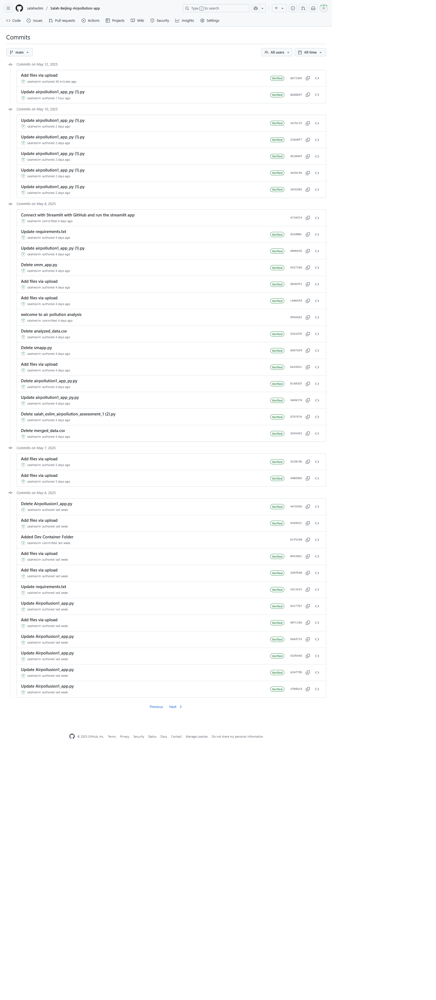

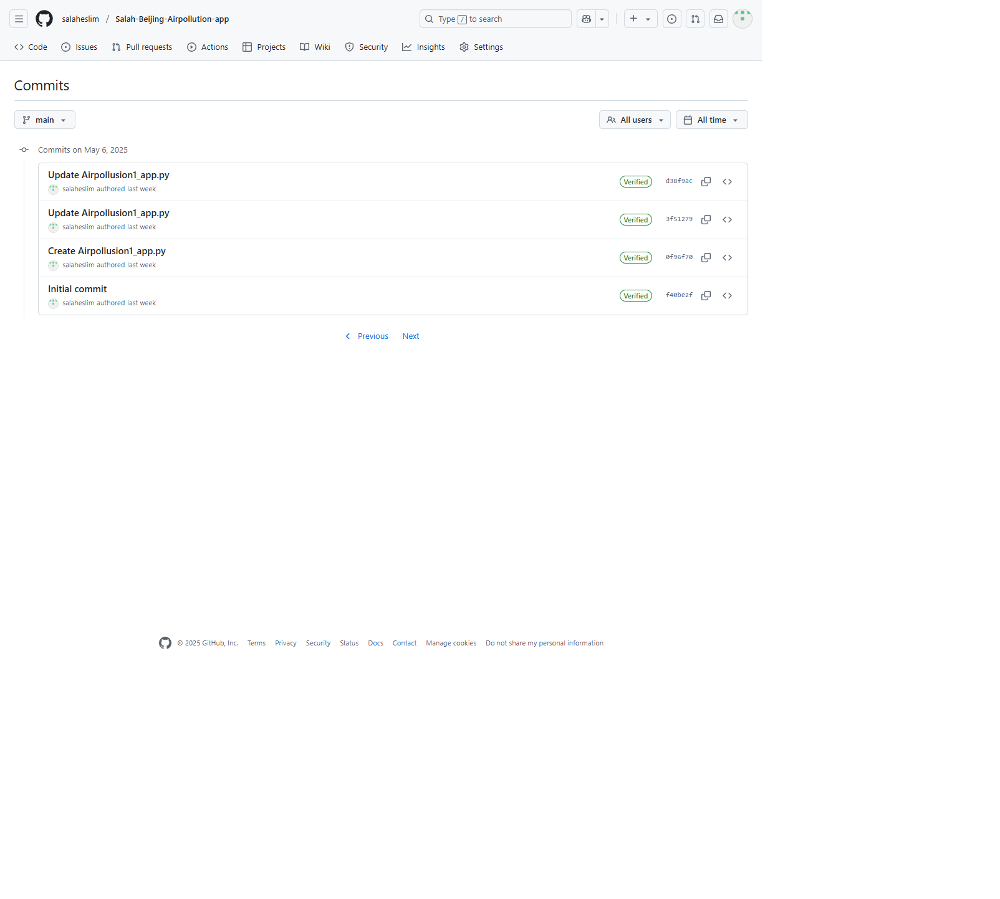